# CMPINF 2100: Midterm exam

## Xinli Zhang

You may add as many code and markdown cells as you see fit to answer the questions.

## You are NOT allowed to collaborate with anyone on this exam.

### Overview

You will demonstrate your ability to merge, group, summarize, visualize, and find patterns in data. This exam uses data associated with a manufacturing example. An overview of the goals, considerations, CSV files, and variables within the data is provided in a presentation on Canvas. Please read through those slides before starting the exam.

The data are provided in 5 separate CSV files. The CSV files are available on Canvas. You **MUST** download the files and save them to the same working directory as this notebook.

The specific instructions in this notebook tell you when you must JOIN the data together. Please read the problems carefully.

The overall objective of this exam is to JOIN data from multiple files in order to explore and find interesting patterns between the machine operating conditions and supplier information. You will report your findings within this notebook by displaying Pandas DataFrames and statistical visualizations via Seaborn and matplotlib when necessary.  

## Import modules

You are permitted to use the following modules on this exam.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

You may also use the following functions from scikit-learn on this exam.

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

You may also use the following sub module from SCIPY.

In [3]:
from scipy.cluster import hierarchy

You are **NOT** permitted to use any other modules or functions. However, you **ARE** permitted to create your own user defined functions if you would like.

## Problem 01

The file names for the 3 machine data sets are provided as strings in the cell below. You are required to read in the CSV files and assign the data to the `m01_df`, `m02_df`, and `m03_df` objects. The data from machine 1 will therefore be associated with `m01_df`, machine 2 is associated with `m02_df`, and machine 3 is associated with `m03_df`.  

In this problem you must explore each of the three machine data sets. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in each data set? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:

* How many unique values for `Batch` are associated with each MACHINE (data set)?
* How many cell phone cases are associated with each `Batch` value for each MACHINE (data set)?
* Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?
* Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the `Batch` values?
* Do the relationships between the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?
* Do the relationships between the OPERATING VARIABLES `x1` through `x4` vary across the `Batch` values?

At the conclusion of this problem, you **MUST** CONCATENATE the 3 MACHINE data sets into a single DataFrame. The single DataFrame must be named `machine_df`. Before concatenating, you **MUST** add a column `machine_id` to each DataFrame with the correct index value for that machine (1, 2, or 3). The concatenating DataFrame variable name is provided as a reminder to you below. 

You may add as many markdown and code cells as you see fit to answer this question. Include markdown cells stating what you see in the figures and why you selected to use them.

#### SOLUTION

In [4]:
# Define the files's for the 3 machine level CSV files

file_m01 = 'midterm_machine_01.csv'

file_m02 = 'midterm_machine_02.csv'

file_m03 = 'midterm_machine_03.csv'

In [5]:
# read in the CSV files and name them accordingly

m01_df = pd.read_csv(file_m01)

m02_df = pd.read_csv(file_m02)

m03_df = pd.read_csv(file_m03)

### m01_df ESSENTIAL activities:

In [6]:
m01_df.shape

(5152, 7)

there are 5152 rows and 7 columns in m01_df

In [7]:
m01_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5152 entries, 0 to 5151
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5152 non-null   object 
 1   Batch   5152 non-null   int64  
 2   s_id    5152 non-null   int64  
 3   x1      5152 non-null   float64
 4   x2      5152 non-null   float64
 5   x3      5152 non-null   float64
 6   x4      5152 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 281.9+ KB


* the columns name are: ID, Batch, s_id, x1, x2, x3, x4.
* the datatypes are: object, int64, int64, float64, float64, float64, float64 respectively.

In [8]:
m01_df.nunique()

ID       5152
Batch      50
s_id      149
x1       5152
x2       5152
x3       5152
x4       5152
dtype: int64

* Columns ID, x1, x2, x3, x4 all have 5152 unique values
* Batch has 50 unique values.
* s_id has 149 unique values.

In [9]:
m01_df.isnull().sum()

ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64

there is no missing values for m01_df

#### m01_df Marginal Behavior:

#### Object

In [10]:
m01_df.head(5)

,ID,Batch,s_id,x1,x2,x3,x4
0,B001-M01-S001,1,1,50.117118,102.167346,22.067812,13.889524
1,B001-M01-S002,1,2,46.887333,112.266102,23.197330,13.064709
2,B001-M01-S003,1,3,50.132744,103.674908,22.319933,13.647482
3,B001-M01-S004,1,4,48.501042,107.143156,22.162947,14.077758
4,B001-M01-S005,1,5,49.690442,102.120283,22.248696,13.728666


In [11]:
m01_df.describe()

,Batch,s_id,x1,x2,x3,x4
count,5152.000000,5152.000000,5152.000000,5152.000000,5152.000000,5152.000000
mean,26.047748,54.540373,51.998218,102.207011,23.947216,10.628436
std,14.560368,33.650665,3.151912,12.888171,2.269325,1.542291
min,1.000000,1.000000,44.275379,65.810729,19.095832,7.644190
25%,13.000000,26.000000,49.335776,96.610288,22.334048,9.479969
50%,27.000000,52.000000,52.536206,104.487824,23.855690,10.356002
75%,39.000000,80.000000,54.662490,110.609442,25.448356,11.318120
max,50.000000,149.000000,58.647186,130.228828,29.477213,14.612911


In [12]:
m01_df['Batch'] = m01_df['Batch'].astype('object')
m01_df['s_id'] = m01_df['s_id'].astype('object')

In [13]:
m01_df.describe(include=object)

,ID,Batch,s_id
count,5152,5152,5152
unique,5152,50,149
top,B001-M01-S001,36,1
freq,1,149,50


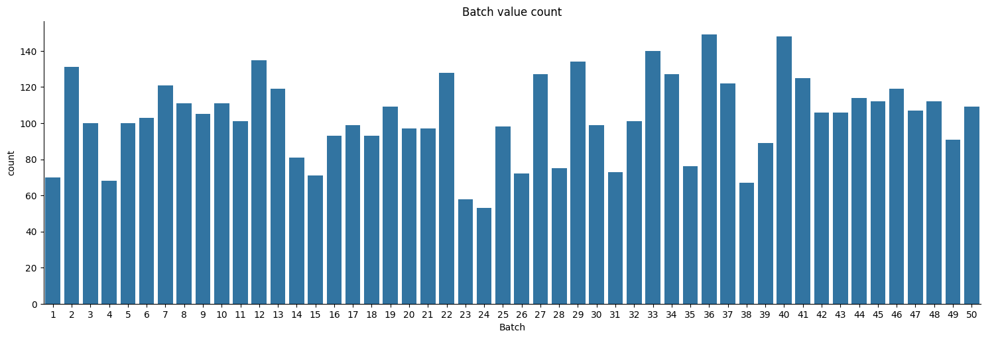

In [14]:
sns.catplot(data = m01_df, x='Batch', kind='count', aspect=3)
plt.title('Batch value count')
plt.show()

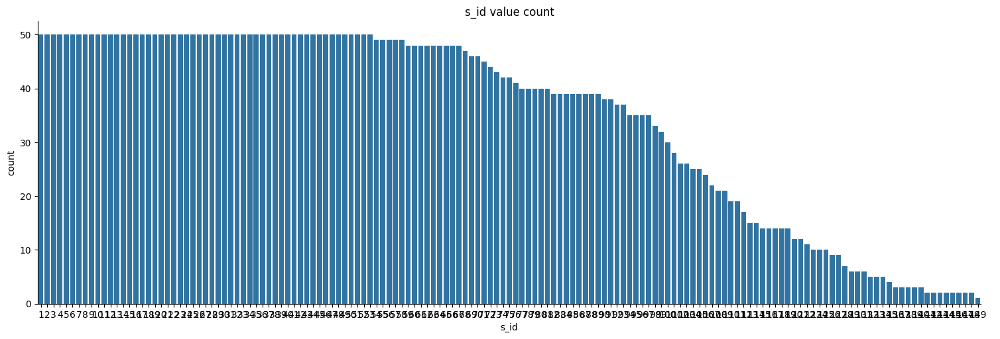

In [15]:
sns.catplot(data = m01_df, x='s_id', kind='count', aspect=3)
plt.title('s_id value count')
plt.show()

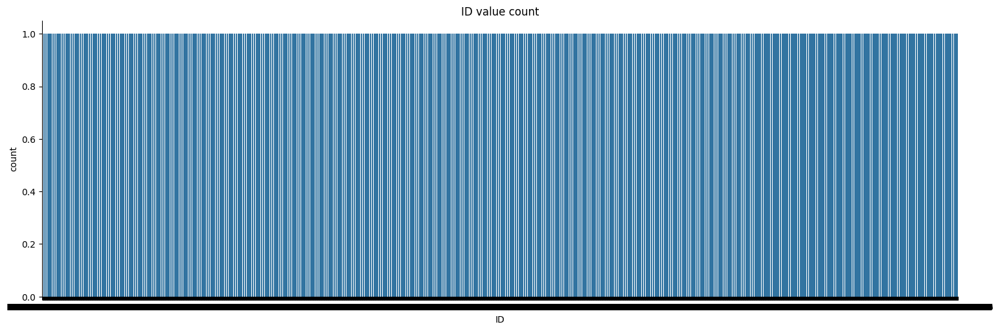

In [16]:
sns.catplot(data = m01_df, x='ID', kind='count', aspect=3)
plt.title('ID value count')
plt.show()

* we can see there are 50 unique values for m01 batch
* the count values are listed in the graph.

#### Numeric

In [17]:
m01_numeric = m01_df.select_dtypes('number').copy()
m01_numeric.head(5)

,x1,x2,x3,x4
0,50.117118,102.167346,22.067812,13.889524
1,46.887333,112.266102,23.197330,13.064709
2,50.132744,103.674908,22.319933,13.647482
3,48.501042,107.143156,22.162947,14.077758
4,49.690442,102.120283,22.248696,13.728666


In [18]:
m01_lf = m01_numeric.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid'])
m01_lf.head(5)

,rowid,variable,value
0,0,x1,50.117118
1,1,x1,46.887333
2,2,x1,50.132744
3,3,x1,48.501042
4,4,x1,49.690442


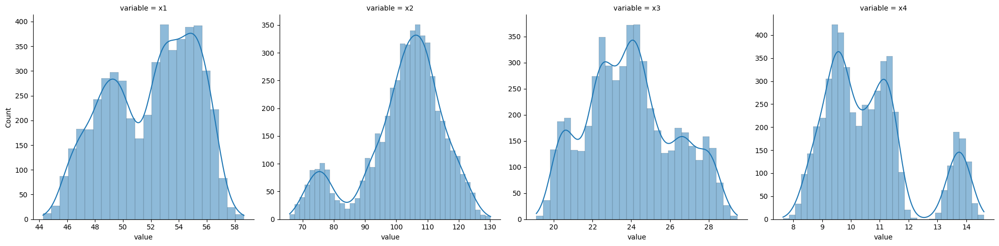

In [19]:
sns.displot(data = m01_lf, x='value', col='variable', kind='hist', kde=True,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False, col_wrap=4)

plt.show()

In [20]:
m01_batch = m01_df.drop(columns=['ID', 's_id'])
m01_batch_lf = m01_batch.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid','Batch'], value_vars=m01_numeric.columns)
m01_batch_lf.head(5)

,rowid,Batch,variable,value
0,0,1,x1,50.117118
1,1,1,x1,46.887333
2,2,1,x1,50.132744
3,3,1,x1,48.501042
4,4,1,x1,49.690442


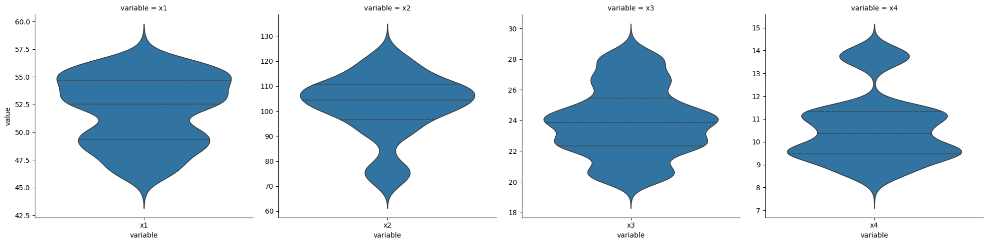

In [21]:
sns.catplot(data=m01_lf, x='variable', y='value', kind='violin', col='variable', 
             col_wrap=4, inner='quartile', sharex=False, sharey=False)
plt.show()

#### summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values (m01)

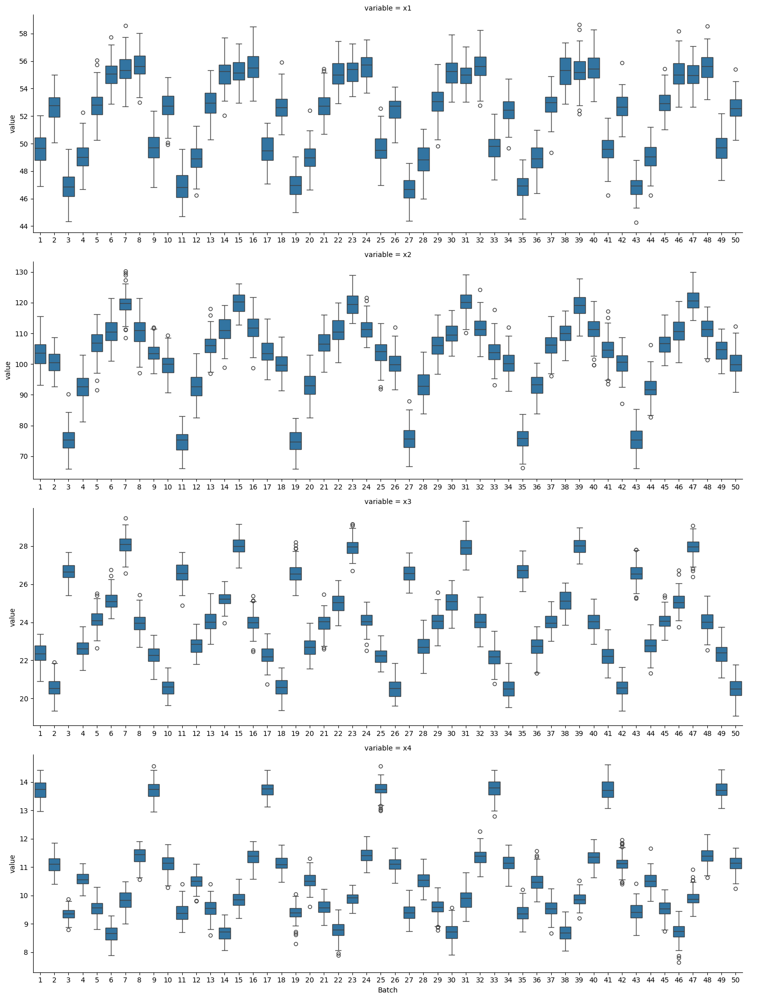

In [22]:
sns.catplot(data=m01_batch_lf, x='Batch', y='value', kind='box', col='variable', 
             col_wrap=1, sharex=False, sharey=False,aspect=3)
plt.show()

#### m01_df Relationship:

##### Relationship between features (total)

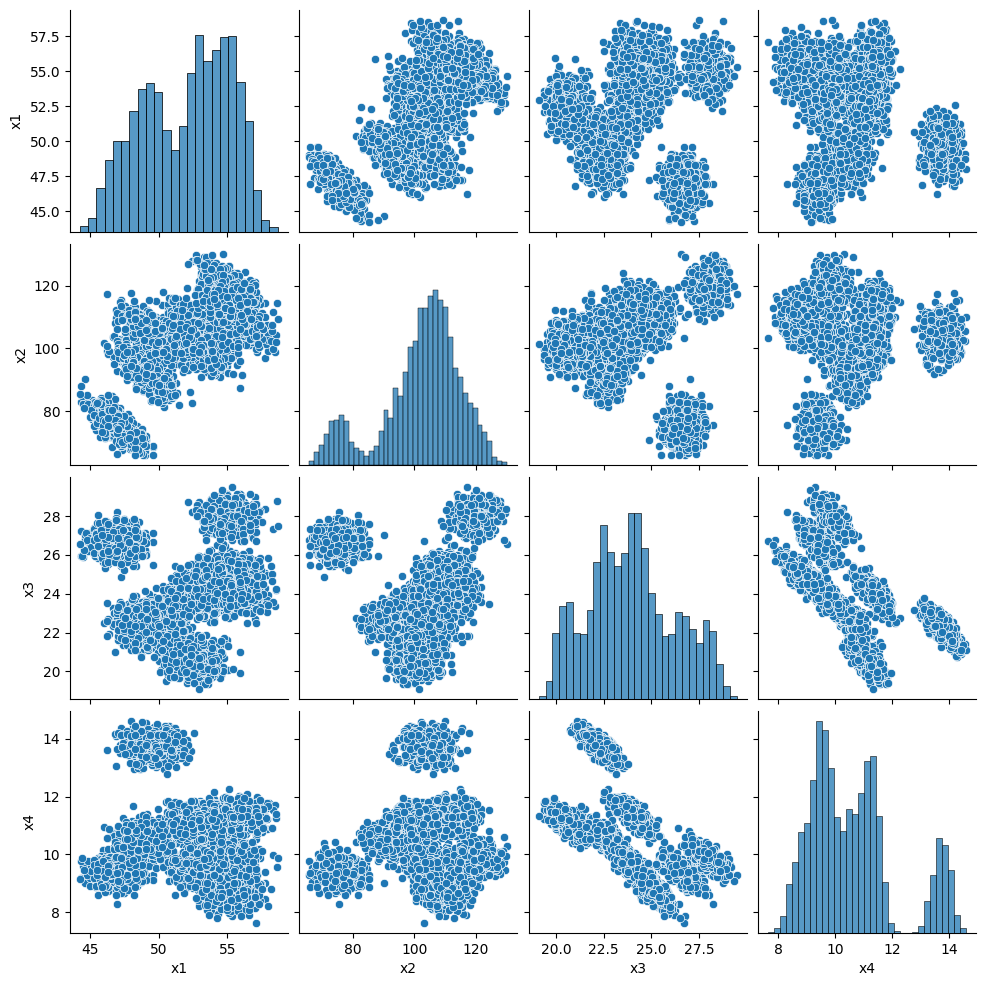

In [23]:
sns.pairplot(data=m01_numeric)
plt.show()

##### Relationship between features (seperate by batch)

In [24]:
m01_batch.head(5)

,Batch,x1,x2,x3,x4
0,1,50.117118,102.167346,22.067812,13.889524
1,1,46.887333,112.266102,23.197330,13.064709
2,1,50.132744,103.674908,22.319933,13.647482
3,1,48.501042,107.143156,22.162947,14.077758
4,1,49.690442,102.120283,22.248696,13.728666


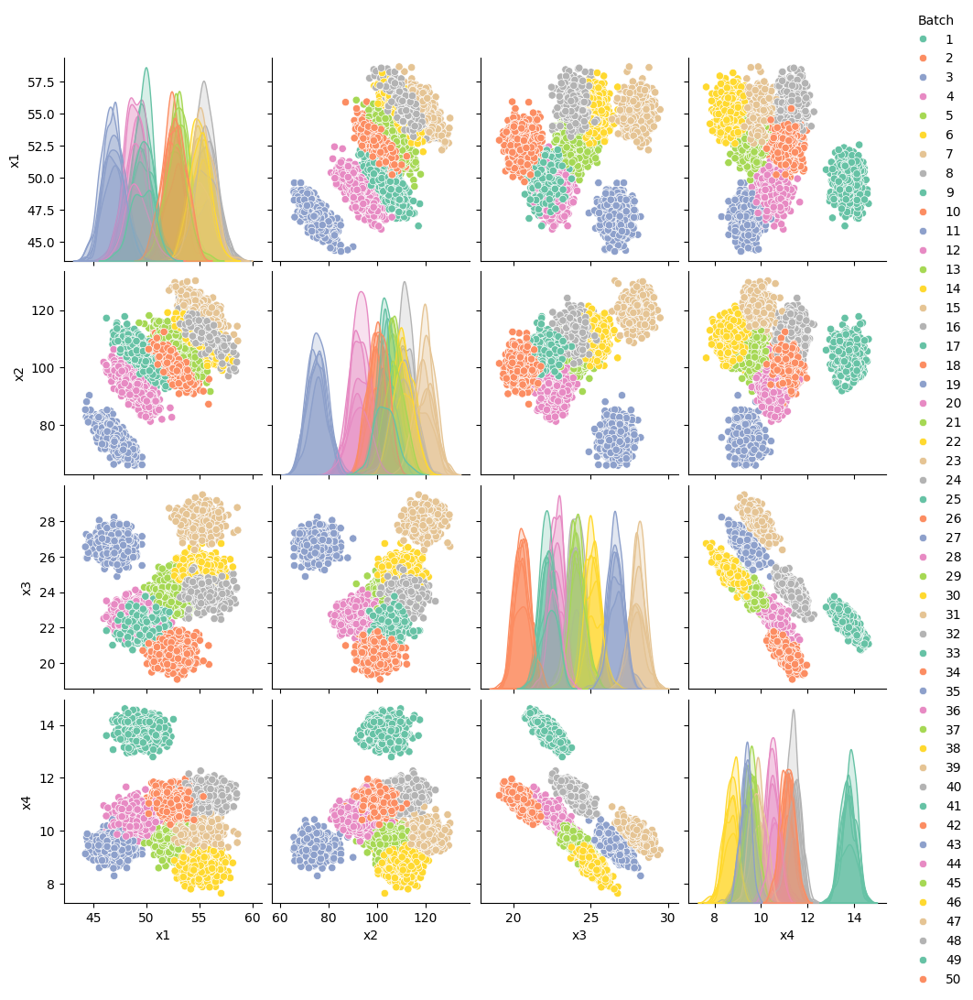

In [25]:
sns.pairplot(data = m01_batch,hue='Batch',palette='Set2')
plt.show()

### m02_df ESSENTIAL activities:

In [26]:
m02_df.shape

(5119, 7)

there are 5119 rows and 7 columns in m02_df

In [27]:
m02_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5119 entries, 0 to 5118
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5119 non-null   object 
 1   Batch   5119 non-null   int64  
 2   s_id    5119 non-null   int64  
 3   x1      5119 non-null   float64
 4   x2      5119 non-null   float64
 5   x3      5119 non-null   float64
 6   x4      5119 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 280.1+ KB


* the columns name are: ID, Batch, s_id, x1, x2, x3, x4.
* the datatypes are: object, int64, int64, float64, float64, float64, float64 respectively.

In [28]:
m02_df.nunique()

ID       5119
Batch      50
s_id      133
x1       5119
x2       5119
x3       5119
x4       5119
dtype: int64

* Columns ID, x1, x2, x3, x4 all have 5119 unique values
* Batch has 50 unique values.
* s_id has 133 unique values.

In [29]:
m02_df.isnull().sum()

ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64

there is no missing values for m02_df

#### m02_df Marginal Behavior:

### Object

In [30]:
m02_df.head(5)

,ID,Batch,s_id,x1,x2,x3,x4
0,B001-M02-S001,1,1,50.213596,100.053754,22.027835,13.839467
1,B001-M02-S002,1,2,49.811232,101.161409,22.436839,13.878907
2,B001-M02-S003,1,3,48.968142,106.184030,22.414990,13.847003
3,B001-M02-S004,1,4,50.477133,107.949816,21.909720,14.193081
4,B001-M02-S005,1,5,50.188501,102.882549,22.306728,13.693529


In [31]:
m02_df.describe()

,Batch,s_id,x1,x2,x3,x4
count,5119.000000,5119.000000,5119.000000,5119.000000,5119.000000,5119.000000
mean,25.929674,52.754444,51.989377,101.998905,23.982312,10.605275
std,14.595274,31.263876,3.095129,12.834348,2.275809,1.523140
min,1.000000,1.000000,44.896759,64.774007,19.232164,7.934064
25%,13.000000,26.000000,49.240567,96.325502,22.372944,9.492226
50%,26.000000,52.000000,52.610949,104.357308,23.894465,10.329911
75%,39.000000,78.000000,54.785418,110.672960,25.546656,11.286062
max,50.000000,133.000000,58.503441,131.009046,29.093229,14.400437


In [32]:
m02_df['Batch'] = m02_df['Batch'].astype('object')
m02_df['s_id'] = m02_df['s_id'].astype('object')

In [33]:
m02_df.describe(include=object)

,ID,Batch,s_id
count,5119,5119,5119
unique,5119,50,133
top,B001-M02-S001,43,1
freq,1,133,50


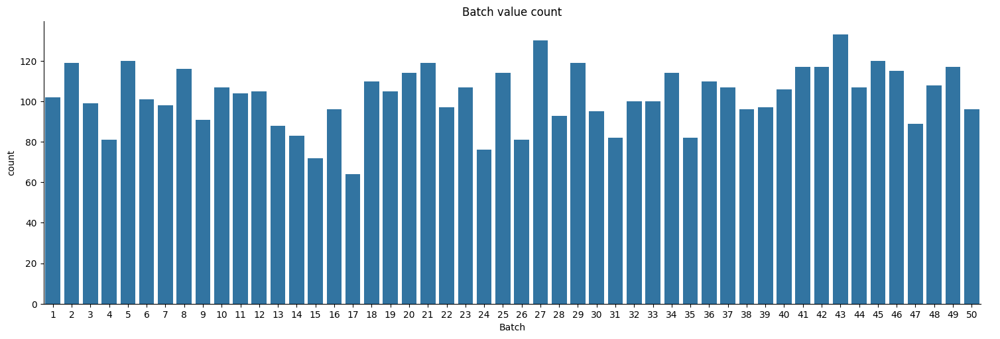

In [34]:
sns.catplot(data = m02_df, x='Batch', kind='count', aspect=3)
plt.title('Batch value count')
plt.show()

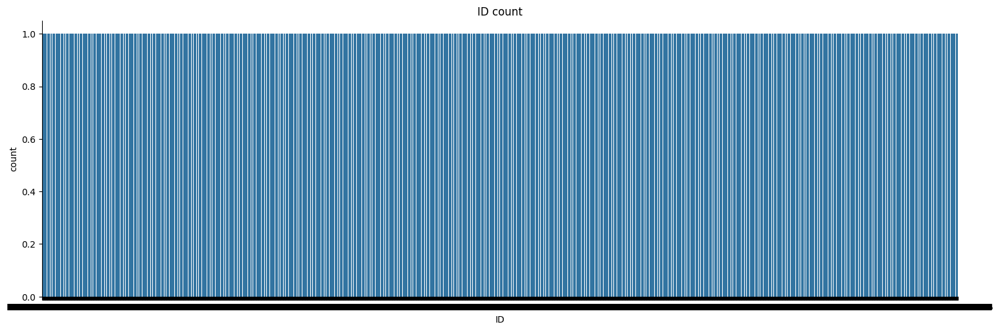

In [35]:
sns.catplot(data = m02_df, x='ID', kind='count', aspect=3)
plt.title('ID count')
plt.show()

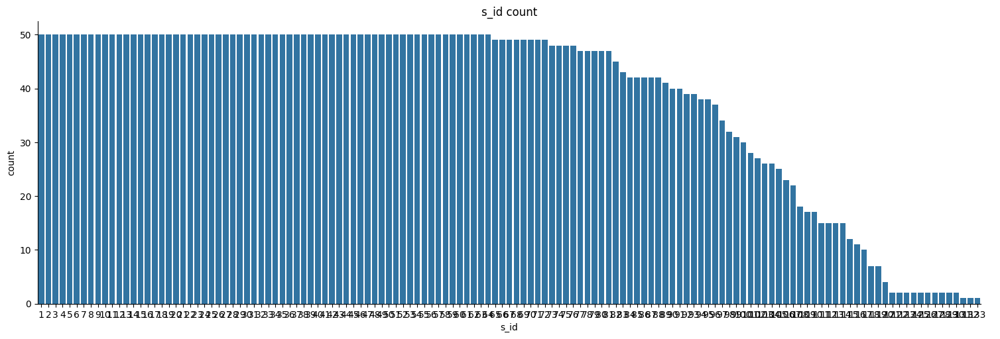

In [36]:
sns.catplot(data = m02_df, x='s_id', kind='count', aspect=3)
plt.title('s_id count')
plt.show()

* we can see there are 50 unique values for m02 batch
* the batch count values are listed in the graph.

#### Numeric

In [37]:
m02_numeric = m02_df.select_dtypes('number').copy()
m02_numeric.head(5)

,x1,x2,x3,x4
0,50.213596,100.053754,22.027835,13.839467
1,49.811232,101.161409,22.436839,13.878907
2,48.968142,106.184030,22.414990,13.847003
3,50.477133,107.949816,21.909720,14.193081
4,50.188501,102.882549,22.306728,13.693529


In [38]:
m02_lf = m02_numeric.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid'])
m02_lf.head(5)

,rowid,variable,value
0,0,x1,50.213596
1,1,x1,49.811232
2,2,x1,48.968142
3,3,x1,50.477133
4,4,x1,50.188501


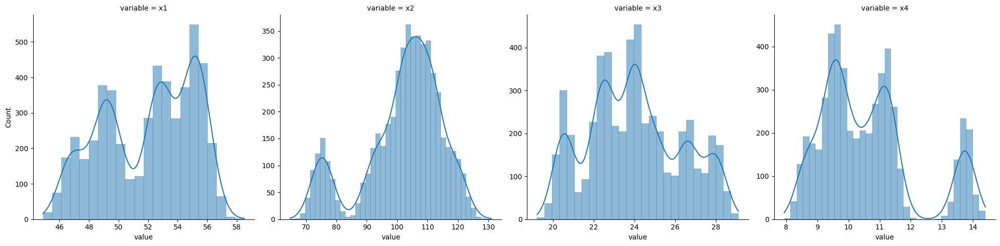

In [39]:
sns.displot(data = m02_lf, x='value', col='variable', kind='hist', kde=True,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False, col_wrap=4 )
plt.show()

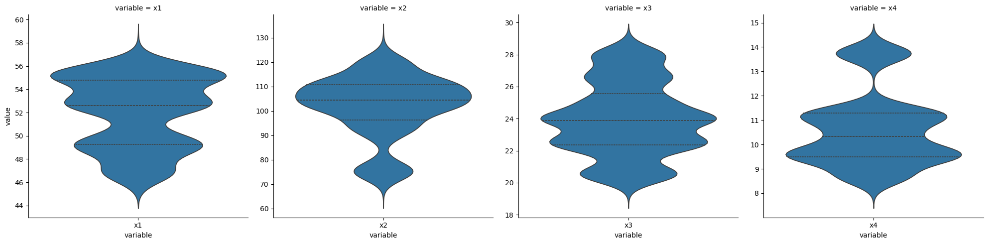

In [40]:
sns.catplot(data=m02_lf, x='variable', y='value', kind='violin', col='variable', 
             col_wrap=4, inner='quartile', sharex=False, sharey=False)
plt.show()

#### summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values (m02)

In [41]:
m02_batch = m02_df.drop(columns=['ID', 's_id'])
m02_batch_lf = m02_batch.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid','Batch'], value_vars=m02_numeric.columns)
m02_batch_lf.head(5)

,rowid,Batch,variable,value
0,0,1,x1,50.213596
1,1,1,x1,49.811232
2,2,1,x1,48.968142
3,3,1,x1,50.477133
4,4,1,x1,50.188501


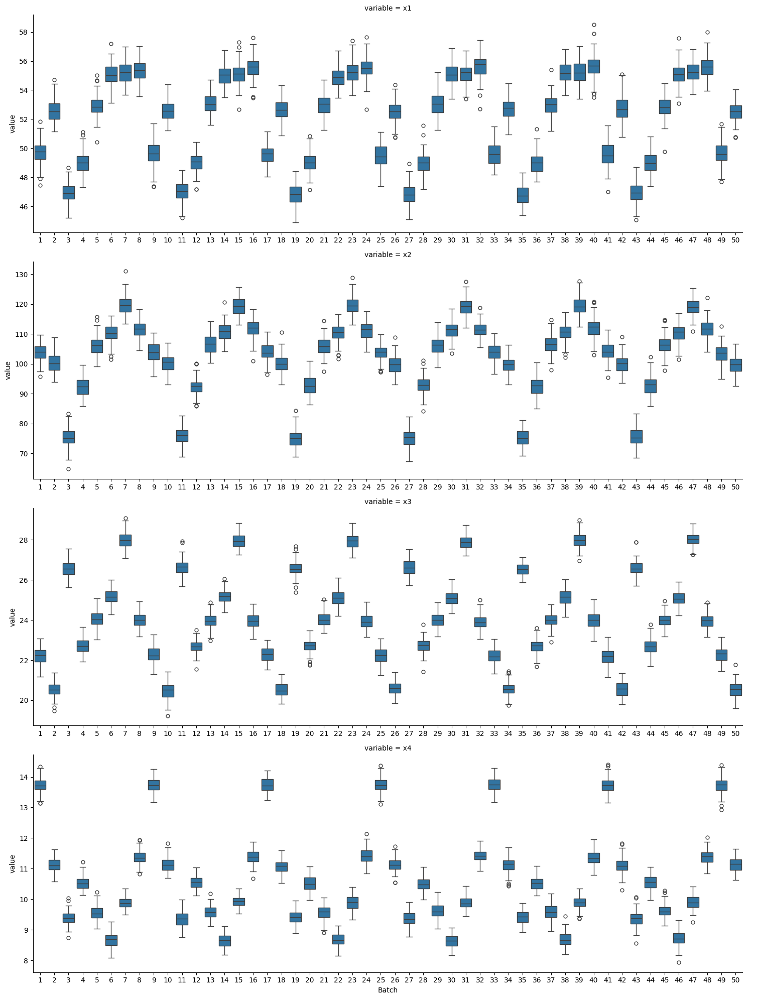

In [42]:
sns.catplot(data=m02_batch_lf, x='Batch', y='value', kind='box', col='variable', 
             col_wrap=1, sharex=False, sharey=False,aspect=3)
plt.show()

#### m02_df Relationship:

##### Relationship between features (total)

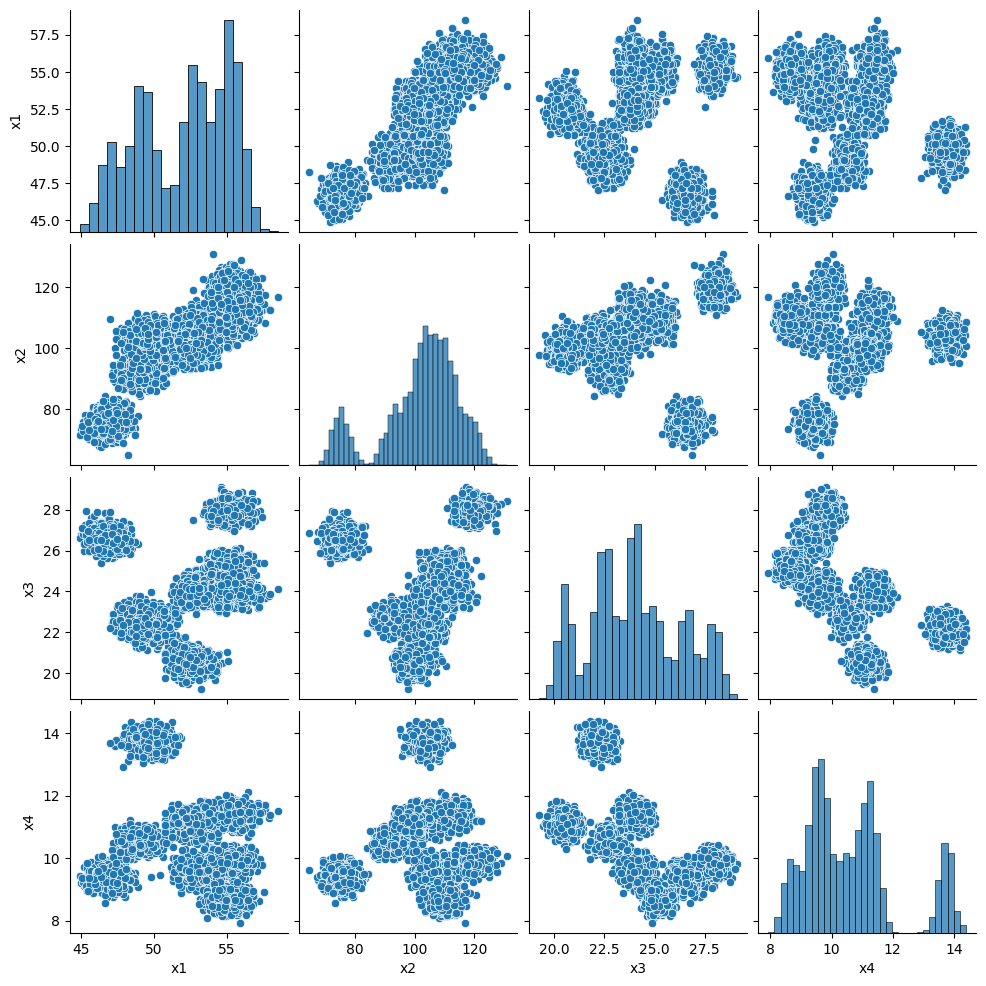

In [43]:
sns.pairplot(data=m02_numeric)
plt.show()

##### Relationship between features (seperate by batch)

In [44]:
m02_df_rel = m02_df.drop(columns=['ID', 's_id'])
m02_df_rel.head(5)

,Batch,x1,x2,x3,x4
0,1,50.213596,100.053754,22.027835,13.839467
1,1,49.811232,101.161409,22.436839,13.878907
2,1,48.968142,106.184030,22.414990,13.847003
3,1,50.477133,107.949816,21.909720,14.193081
4,1,50.188501,102.882549,22.306728,13.693529


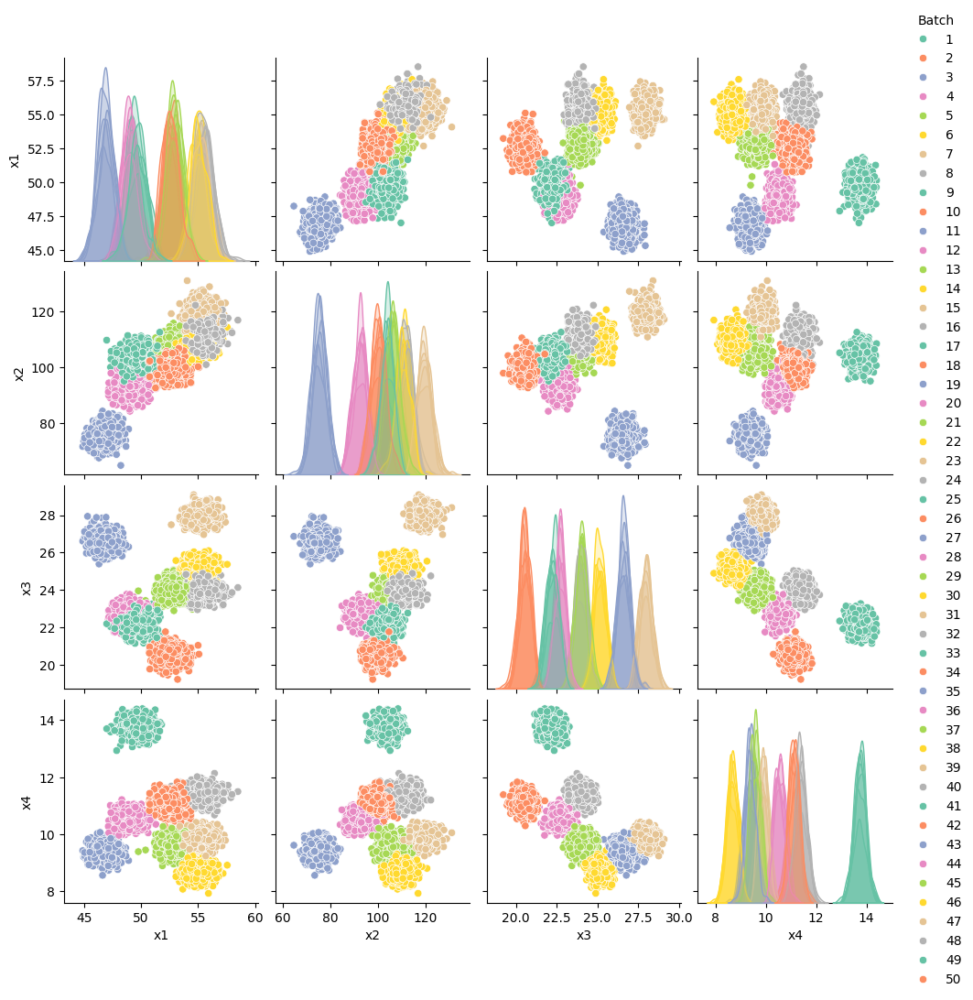

In [45]:
sns.pairplot(data=m02_df_rel,hue='Batch', palette='Set2')
plt.show()

### m03_df ESSENTIAL activities:

In [46]:
m03_df.shape

(4458, 7)

there are 5119 rows and 7 columns in m02_df

In [47]:
m03_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4458 entries, 0 to 4457
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      4458 non-null   object 
 1   Batch   4458 non-null   int64  
 2   s_id    4458 non-null   int64  
 3   x1      4458 non-null   float64
 4   x2      4458 non-null   float64
 5   x3      4458 non-null   float64
 6   x4      4458 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 243.9+ KB


* the columns name are: ID, Batch, s_id, x1, x2, x3, x4.
* the datatypes are: object, int64, int64, float64, float64, float64, float64 respectively.

In [48]:
m03_df.nunique()

ID       4458
Batch      41
s_id      141
x1       4458
x2       4458
x3       4458
x4       4458
dtype: int64

* Columns ID, x1, x2, x3, x4 all have 4458 unique values
* Batch has 41 unique values.
* s_id has 141 unique values.

In [49]:
m03_df.isnull().sum()

ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64

there is no missing values for m03_df

#### m03_df Marginal Behavior:

### Object

In [50]:
m03_df.head(5)

,ID,Batch,s_id,x1,x2,x3,x4
0,B001-M03-S001,1,1,49.317142,103.793803,21.848400,13.539224
1,B001-M03-S002,1,2,49.983523,106.266817,22.530393,13.741064
2,B001-M03-S003,1,3,48.762702,98.864632,22.462081,13.818300
3,B001-M03-S004,1,4,50.009580,104.689498,22.369850,13.849127
4,B001-M03-S005,1,5,48.892358,102.974600,22.657941,13.795078


In [51]:
m03_df.describe()

,Batch,s_id,x1,x2,x3,x4
count,4458.00000,4458.000000,4458.000000,4458.000000,4458.000000,4458.000000
mean,26.24428,56.475774,51.857672,101.650057,23.927679,10.602371
std,14.28990,33.827427,3.022646,12.243012,2.035196,1.554708
min,1.00000,1.000000,45.690397,70.192150,19.865338,8.155668
25%,14.00000,28.000000,49.228020,95.381831,22.457249,9.475467
50%,27.00000,55.000000,52.598712,104.712727,23.900193,10.351781
75%,38.00000,83.000000,54.810528,110.050211,25.142293,11.301126
max,49.00000,141.000000,56.981029,126.332105,28.972747,14.182623


In [52]:
m03_df['Batch'] = m03_df['Batch'].astype('object')
m03_df['s_id'] = m03_df['s_id'].astype('object')

In [53]:
m03_df.describe(include=object)

,ID,Batch,s_id
count,4458,4458,4458
unique,4458,41,141
top,B001-M03-S001,5,1
freq,1,141,41


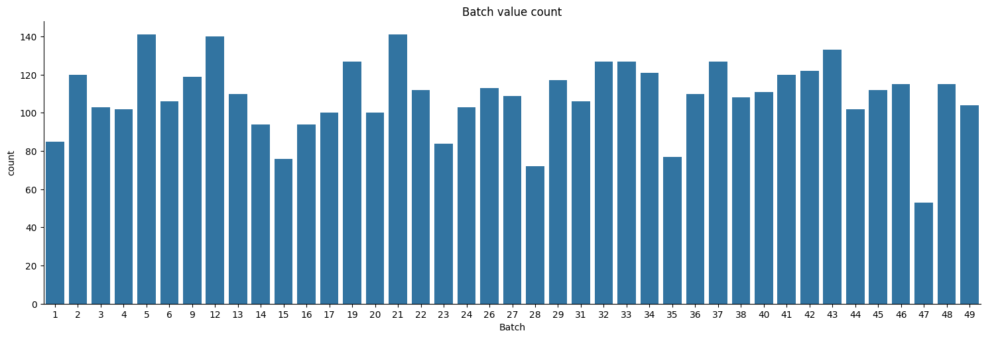

In [54]:
sns.catplot(data=m03_df, x='Batch', kind='count', aspect=3)
plt.title('Batch value count')
plt.show()

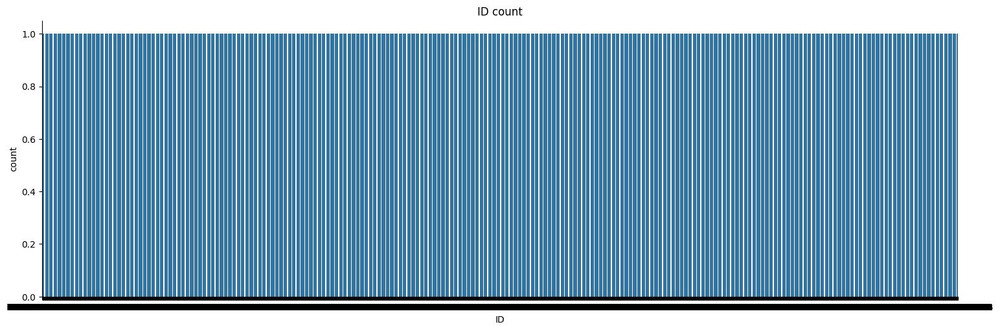

In [55]:
sns.catplot(data=m03_df, x='ID', kind='count', aspect=3)
plt.title('ID count')
plt.show()

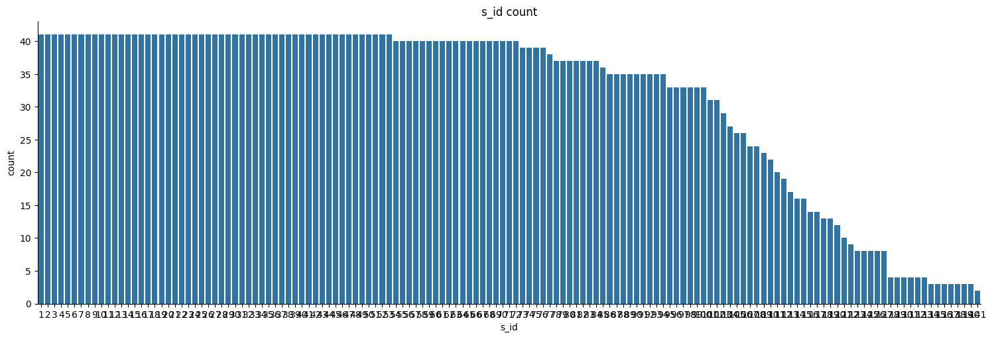

In [56]:
sns.catplot(data=m03_df, x='s_id', kind='count', aspect=3)
plt.title('s_id count')
plt.show()

* we can see there are 49 unique values for m03 batch
* the batch count values are listed in the graph.

#### Numeric

In [57]:
m03_numeric=m03_df.select_dtypes('number').copy()
m03_numeric.head(5)

,x1,x2,x3,x4
0,49.317142,103.793803,21.848400,13.539224
1,49.983523,106.266817,22.530393,13.741064
2,48.762702,98.864632,22.462081,13.818300
3,50.009580,104.689498,22.369850,13.849127
4,48.892358,102.974600,22.657941,13.795078


In [58]:
m03_lf = m03_numeric.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid'])
m03_lf.head(5)

,rowid,variable,value
0,0,x1,49.317142
1,1,x1,49.983523
2,2,x1,48.762702
3,3,x1,50.009580
4,4,x1,48.892358


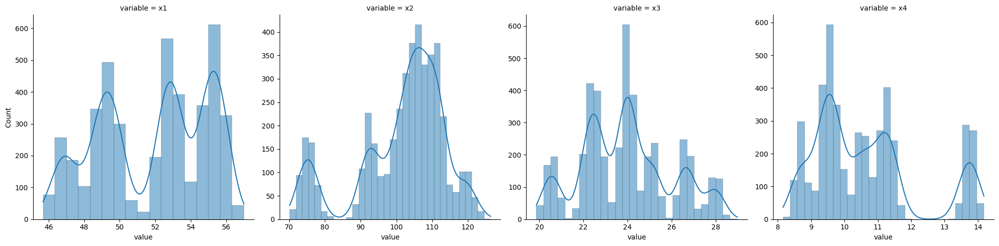

In [59]:
sns.displot(data=m03_lf, x='value',col='variable', kind='hist', kde=True,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False, col_wrap=4 )
plt.show()

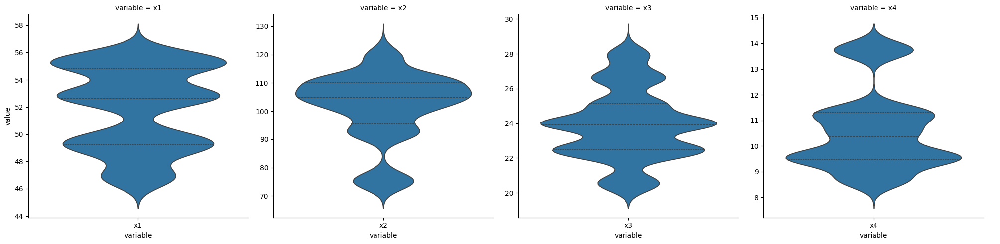

In [60]:
sns.catplot(data=m03_lf, x='variable', y='value', col='variable', kind='violin', 
            sharex=False, sharey=False, inner='quartile', col_wrap=4 )
plt.show()

#### summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values (m03)

In [61]:
m03_batch = m03_df.drop(columns=['ID', 's_id'])
m03_batch_lf = m03_df.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid','Batch'], value_vars=m03_numeric.columns)
m03_batch_lf.head(5)

,rowid,Batch,variable,value
0,0,1,x1,49.317142
1,1,1,x1,49.983523
2,2,1,x1,48.762702
3,3,1,x1,50.009580
4,4,1,x1,48.892358


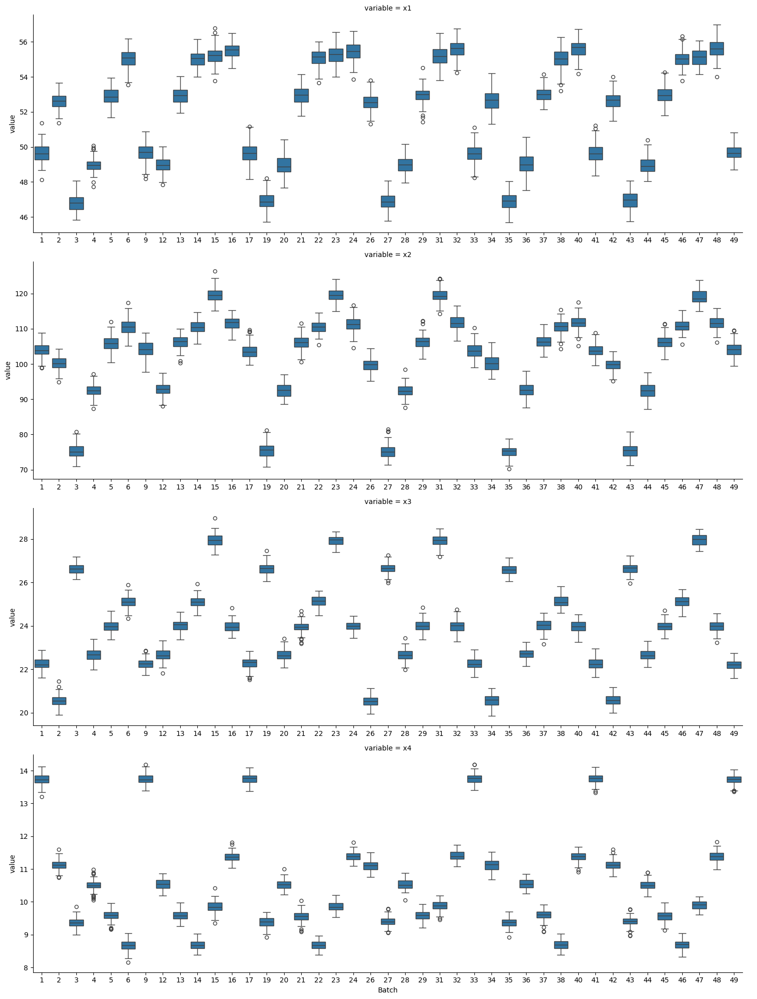

In [62]:
sns.catplot(data=m03_batch_lf, x='Batch', y='value', kind='box', col='variable', 
             col_wrap=1, sharex=False, sharey=False,aspect=3)
plt.show()

#### m03_df Relationship:

##### Relationship between features (total)

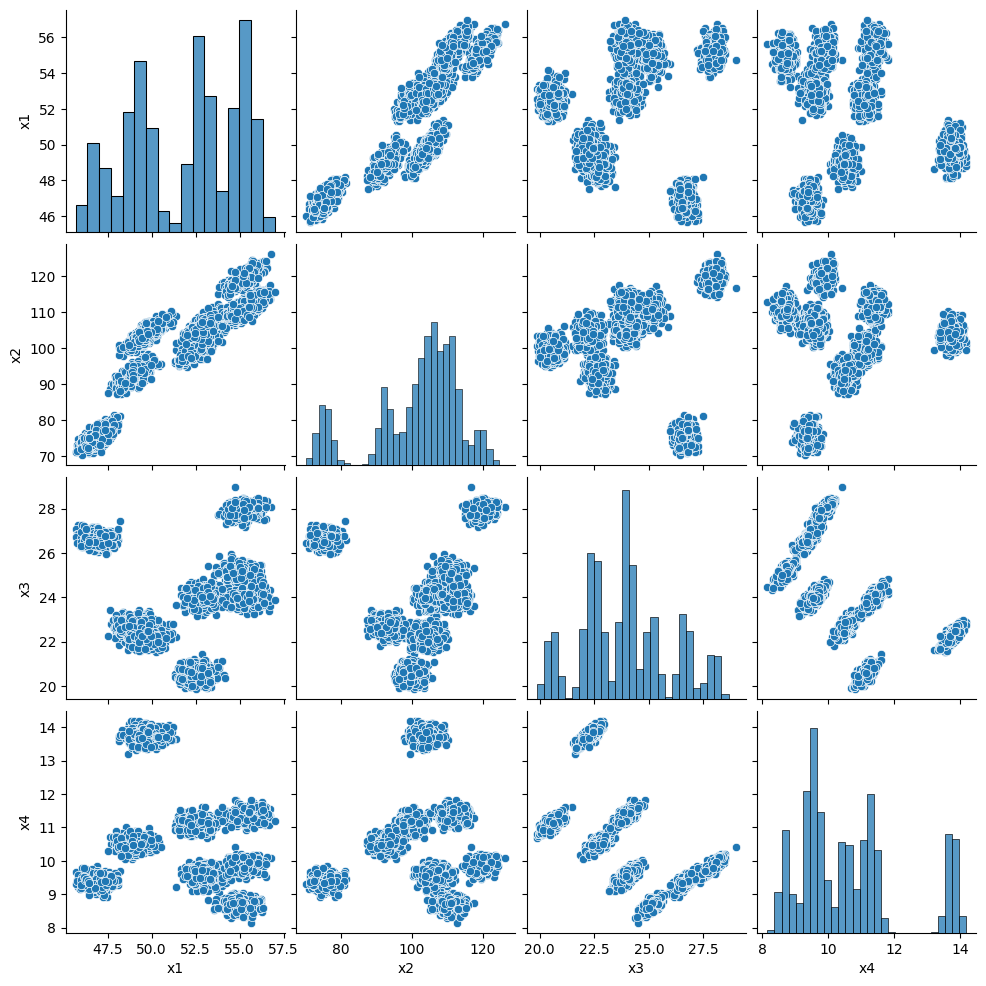

In [63]:
sns.pairplot(data=m03_numeric)
plt.show()

In [64]:
m03_df_rel = m03_df.drop(columns=['ID','s_id'])
m03_df_rel.head(5)

,Batch,x1,x2,x3,x4
0,1,49.317142,103.793803,21.848400,13.539224
1,1,49.983523,106.266817,22.530393,13.741064
2,1,48.762702,98.864632,22.462081,13.818300
3,1,50.009580,104.689498,22.369850,13.849127
4,1,48.892358,102.974600,22.657941,13.795078


##### Relationship between features (seperate by batch)

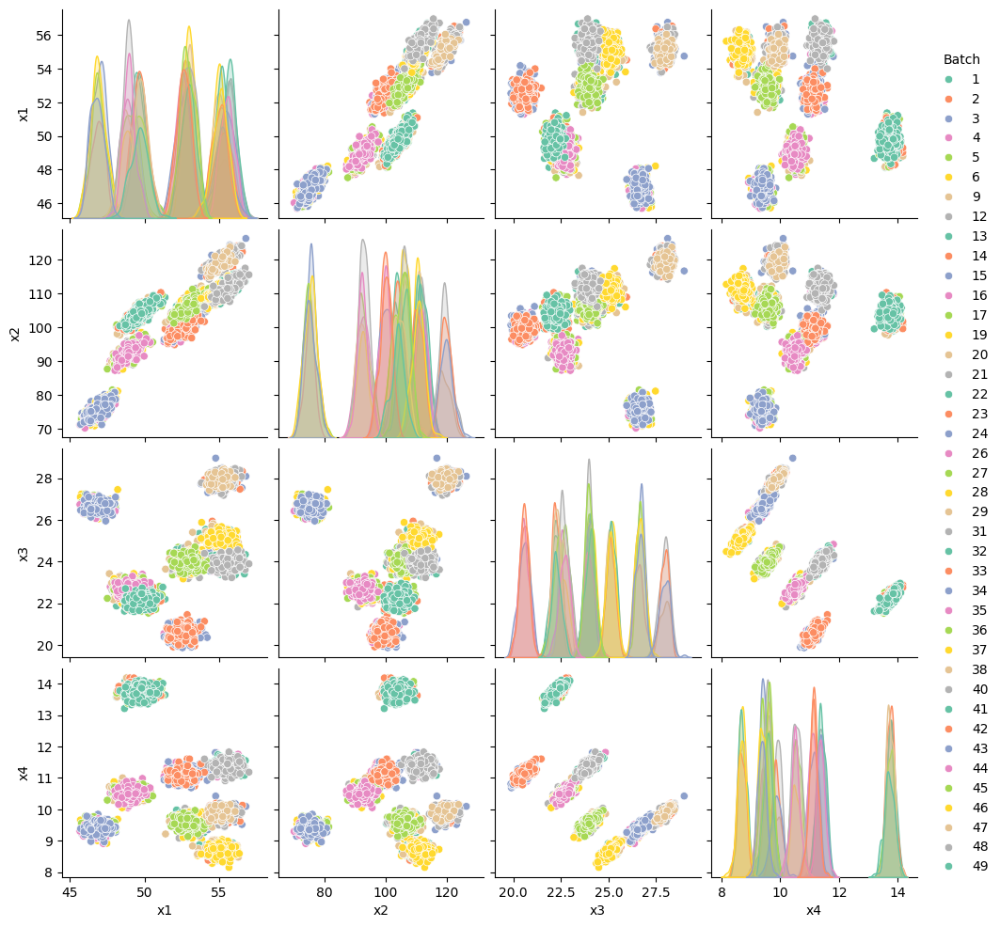

In [65]:
sns.pairplot(data=m03_df_rel, hue='Batch', palette='Set2')
plt.show()

In [66]:
# concatenate the 3 DataFrames into a single DataFrame which includes the `machine_id` variable
m01_df['machine_id'] = 1
m02_df['machine_id'] = 2
m03_df['machine_id'] = 3

machine_df = pd.concat([m01_df, m02_df, m03_df])
machine_df['machine_id'] = machine_df['machine_id'].astype('object')
machine_df.head(5)

,ID,Batch,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S001,1,1,50.117118,102.167346,22.067812,13.889524,1
1,B001-M01-S002,1,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S003,1,3,50.132744,103.674908,22.319933,13.647482,1
3,B001-M01-S004,1,4,48.501042,107.143156,22.162947,14.077758,1
4,B001-M01-S005,1,5,49.690442,102.120283,22.248696,13.728666,1


In [67]:
machine_df.shape

(14729, 8)

* batch_df has 14729 rows and 8 columns.

In [68]:
machine_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14729 entries, 0 to 4457
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          14729 non-null  object 
 1   Batch       14729 non-null  object 
 2   s_id        14729 non-null  object 
 3   x1          14729 non-null  float64
 4   x2          14729 non-null  float64
 5   x3          14729 non-null  float64
 6   x4          14729 non-null  float64
 7   machine_id  14729 non-null  object 
dtypes: float64(4), object(4)
memory usage: 1.0+ MB


* the columns name are: ID, Batch, s_id, x1, x2, x3, x4, machine_id
* the datatypes are: object, object, object, float64, float64, float64, float64，object respectively

In [69]:
machine_df.describe()

,x1,x2,x3,x4
count,14729.000000,14729.000000,14729.000000,14729.000000
mean,51.952606,101.966113,23.953500,10.612497
std,3.093916,12.678550,2.203383,1.539387
min,44.275379,64.774007,19.095832,7.644190
25%,49.257492,96.189442,22.394977,9.481281
50%,52.586639,104.533114,23.883004,10.344656
75%,54.757788,110.415780,25.343060,11.300265
max,58.647186,131.009046,29.477213,14.612911


In [70]:
machine_df.select_dtypes('object').describe()

,ID,Batch,s_id,machine_id
count,14729,14729,14729,14729
unique,14729,50,149,3
top,B001-M01-S001,12,1,1
freq,1,380,141,5152


In [71]:
machine_df.nunique()

ID            14729
Batch            50
s_id            149
x1            14729
x2            14729
x3            14729
x4            14729
machine_id        3
dtype: int64

In [72]:
machine_df.isnull().sum()

ID            0
Batch         0
s_id          0
x1            0
x2            0
x3            0
x4            0
machine_id    0
dtype: int64

* Columns ID, x1, x2, x3, x4 all have 14729 unique values
* Batch has 50 unique values.
* s_id has 14729 unique values.
* there is no null values in the dataset

#### machine_df summary statistics 

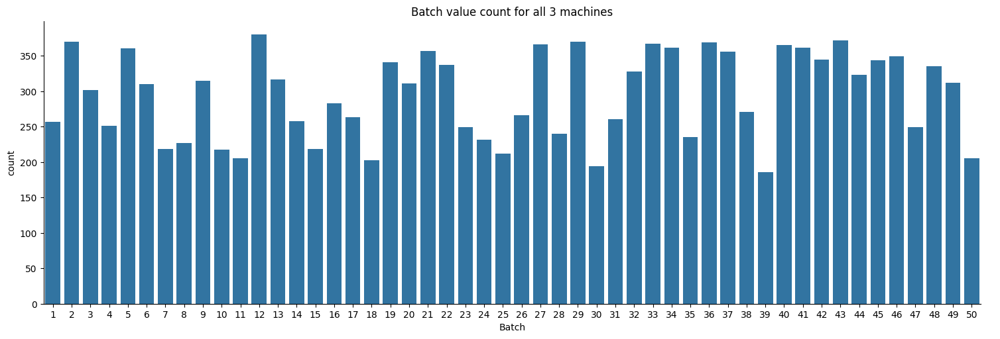

In [73]:
sns.catplot(data=machine_df, x='Batch', kind='count',aspect=3)
plt.title('Batch value count for all 3 machines')
plt.show()

* we can see there are 50 unique values for combine 3 machines batch
* the batch count values are listed in the graph.

In [74]:
list=['x1','x2','x3','x4']
machine_lf = machine_df.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid', 'machine_id', 'Batch'], value_vars=list)
machine_lf.head(5)

,rowid,machine_id,Batch,variable,value
0,0,1,1,x1,50.117118
1,1,1,1,x1,46.887333
2,2,1,1,x1,50.132744
3,3,1,1,x1,48.501042
4,4,1,1,x1,49.690442


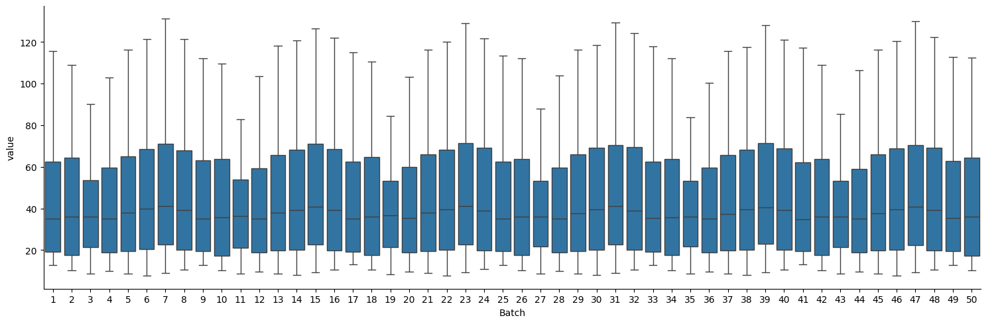

In [75]:
sns.catplot(data=machine_lf,x='Batch', y='value', kind='box',aspect=3)
plt.show()

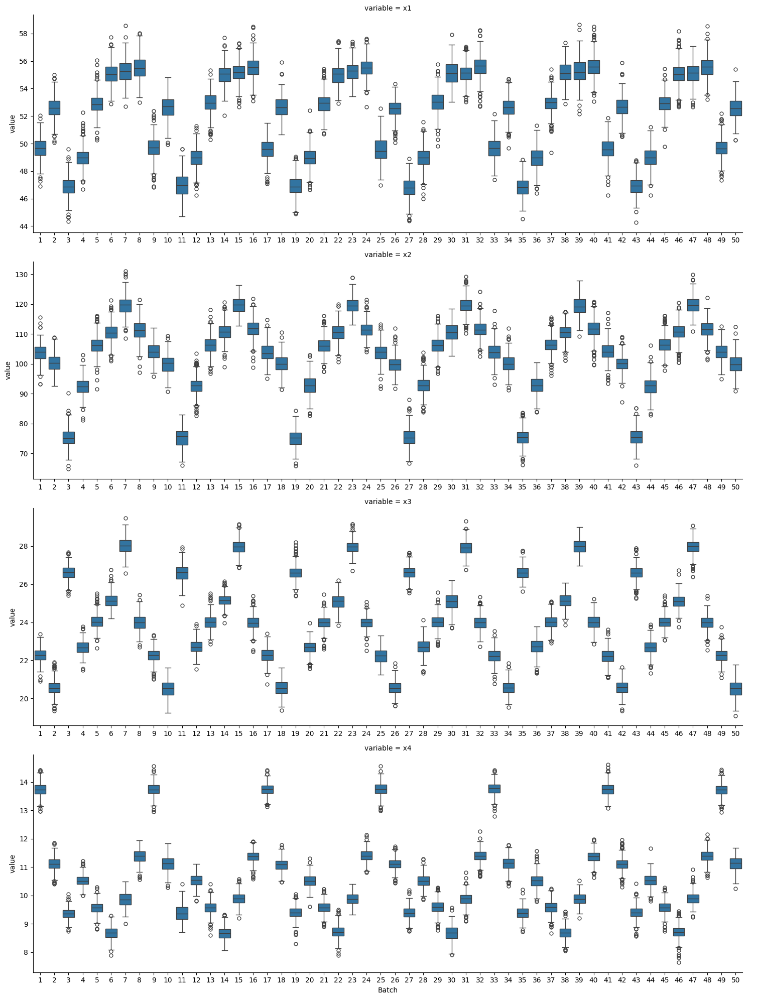

In [76]:
sns.catplot(data=machine_lf,x='Batch', y='value', col='variable', kind='box', sharex=False, sharey=False, col_wrap=1, aspect=3)
plt.show()

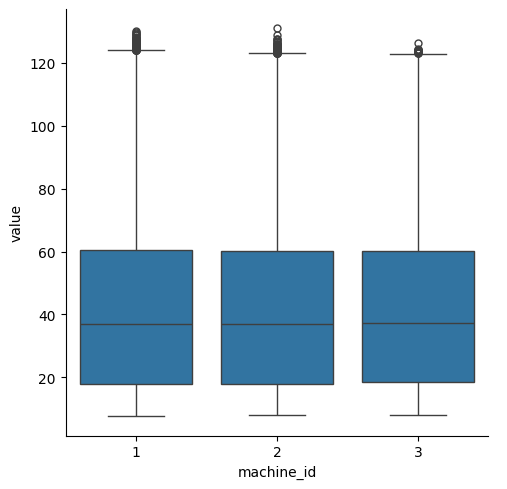

In [77]:
sns.catplot(data=machine_lf,x='machine_id', y='value', kind='box')
plt.show()

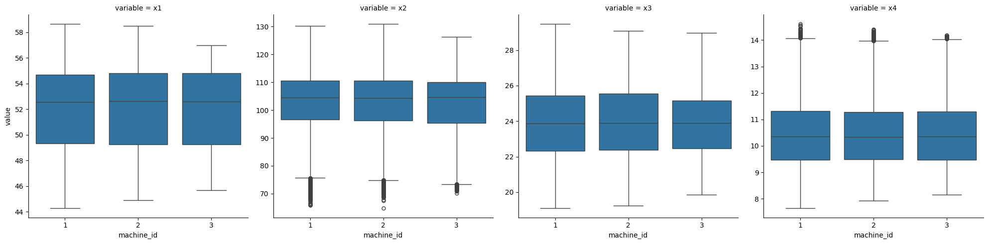

In [78]:
sns.catplot(data=machine_lf,x='machine_id', y='value', col='variable', kind='box', sharex=False, sharey=False, col_wrap=4)
plt.show()

* we can see from plot that OPERATING VARIABLES x1 through x4 didnt vary too much

In [79]:
machine_num = machine_df.select_dtypes('number')
machine_num.head(5)

,x1,x2,x3,x4
0,50.117118,102.167346,22.067812,13.889524
1,46.887333,112.266102,23.197330,13.064709
2,50.132744,103.674908,22.319933,13.647482
3,48.501042,107.143156,22.162947,14.077758
4,49.690442,102.120283,22.248696,13.728666


#### machine_df reltaionship

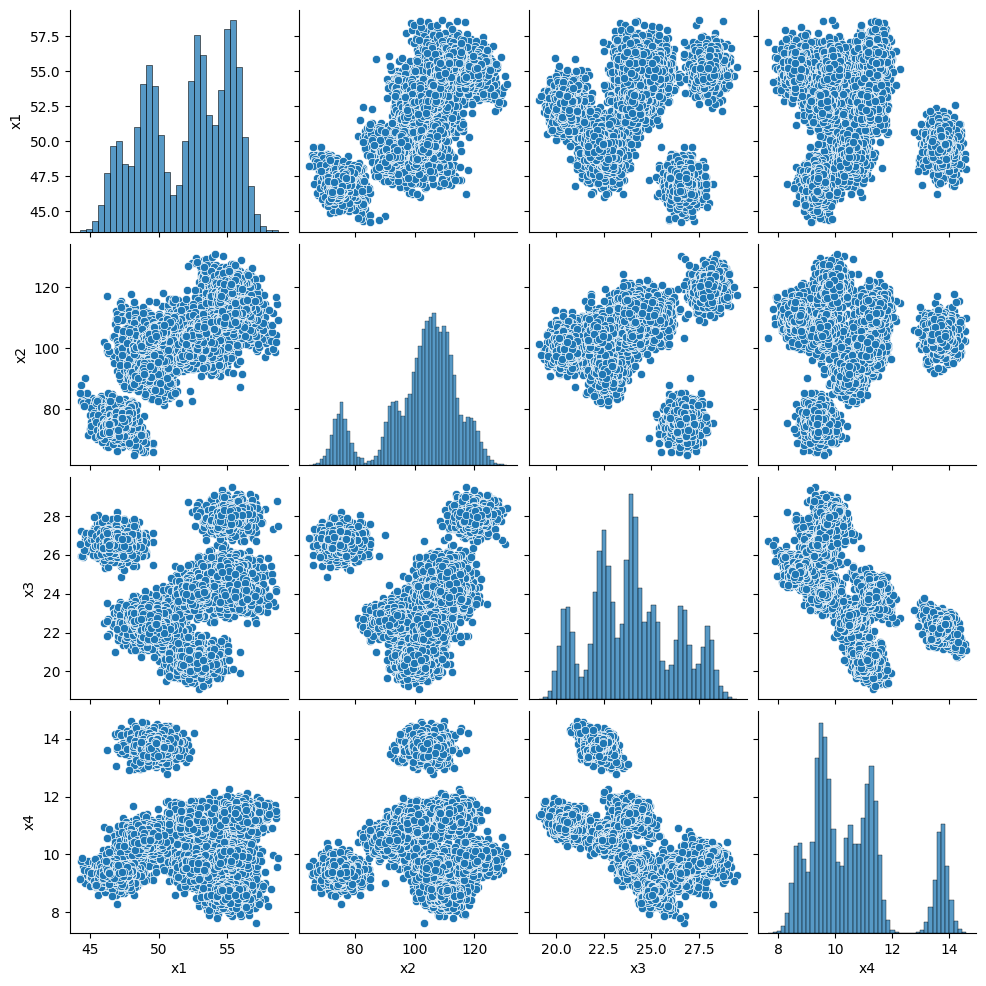

In [80]:
sns.pairplot(data=machine_num)
plt.show()

<Axes: >

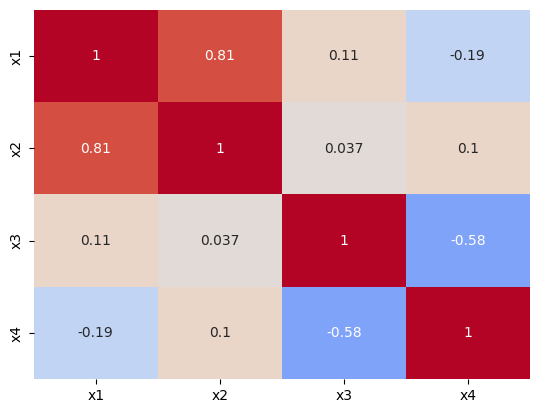

In [81]:
sns.heatmap(data=machine_num.corr(),vmin=-1, vmax=1, center = 0,
                     cmap='coolwarm', cbar=False,
                     annot=True)

In [82]:
machine_corr = machine_df.loc[ :, ['x1', 'x2', 'x3', 'x4', 'machine_id']].groupby(['machine_id']).corr()
machine_corr

x1        x2        x3        x4
machine_id                                           
1          x1  1.000000  0.725695  0.117574 -0.191357
           x2  0.725695  1.000000  0.064586  0.091319
           x3  0.117574  0.064586  1.000000 -0.584667
           x4 -0.191357  0.091319 -0.584667  1.000000
2          x1  1.000000  0.850194  0.110249 -0.187127
           x2  0.850194  1.000000  0.056123  0.102422
           x3  0.110249  0.056123  1.000000 -0.569695
           x4 -0.187127  0.102422 -0.569695  1.000000
3          x1  1.000000  0.883526  0.093064 -0.199686
           x2  0.883526  1.000000 -0.024685  0.114277
           x3  0.093064 -0.024685  1.000000 -0.573415
           x4 -0.199686  0.114277 -0.573415  1.000000

In [83]:
machine_list = machine_df.machine_id.unique().tolist()

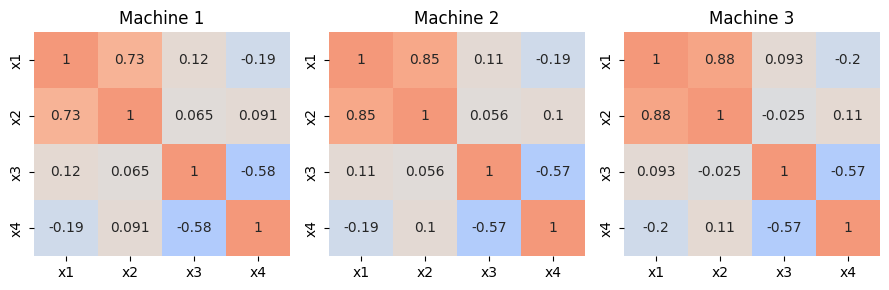

In [84]:
fig, axes = plt.subplots(1,len(machine_list), figsize=(9, 3))

for idx, machine_id in enumerate(machine_list):
    machine_data = machine_df[machine_df['machine_id'] == machine_id][['x1', 'x2', 'x3', 'x4']]

    sns.heatmap(data=machine_data.corr(), vmin=-1, vmax=2, center=0,
        cmap='coolwarm', cbar=False, annot=True, ax=axes[idx])
    axes[idx].set_title(f'Machine {machine_id}')

plt.tight_layout()
plt.show()

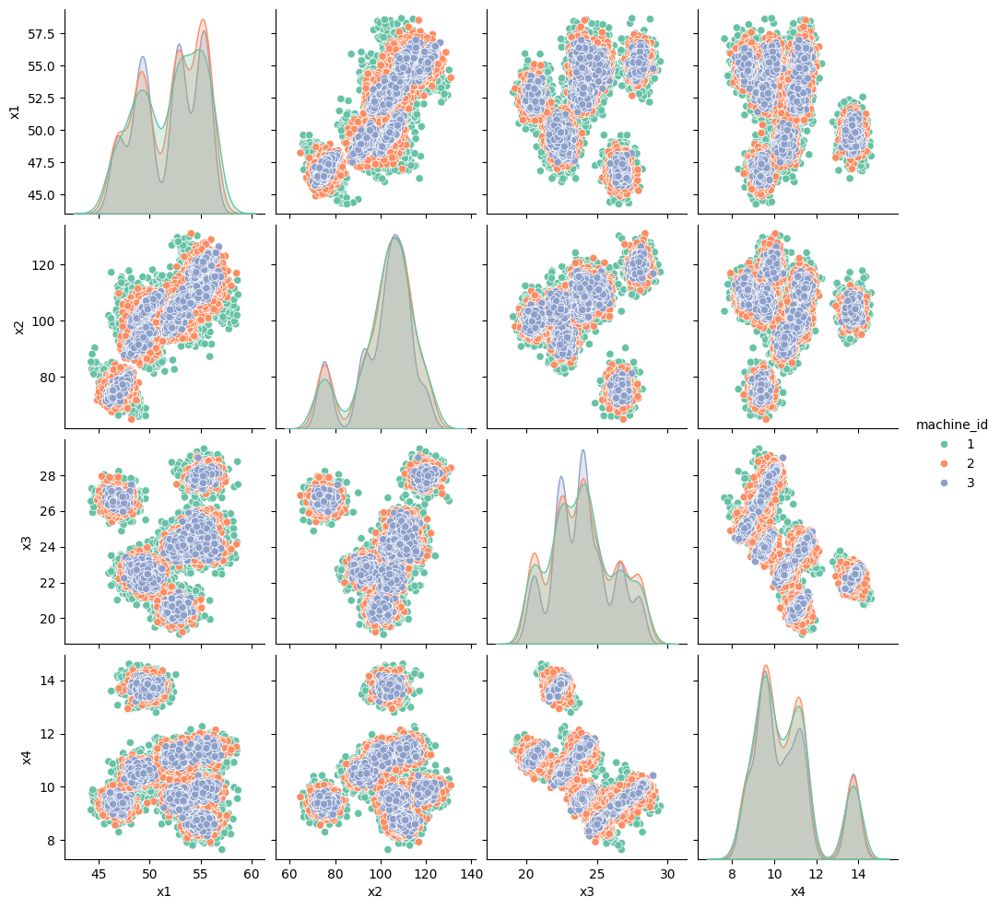

In [85]:
sns.pairplot(data=machine_df.drop(columns=['ID','s_id','Batch']), hue='machine_id', palette='Set2')
plt.show()

In [86]:
machine_df_rel = machine_df.drop(columns=['ID','s_id','machine_id'])
machine_df_rel.head(5)

,Batch,x1,x2,x3,x4
0,1,50.117118,102.167346,22.067812,13.889524
1,1,46.887333,112.266102,23.197330,13.064709
2,1,50.132744,103.674908,22.319933,13.647482
3,1,48.501042,107.143156,22.162947,14.077758
4,1,49.690442,102.120283,22.248696,13.728666


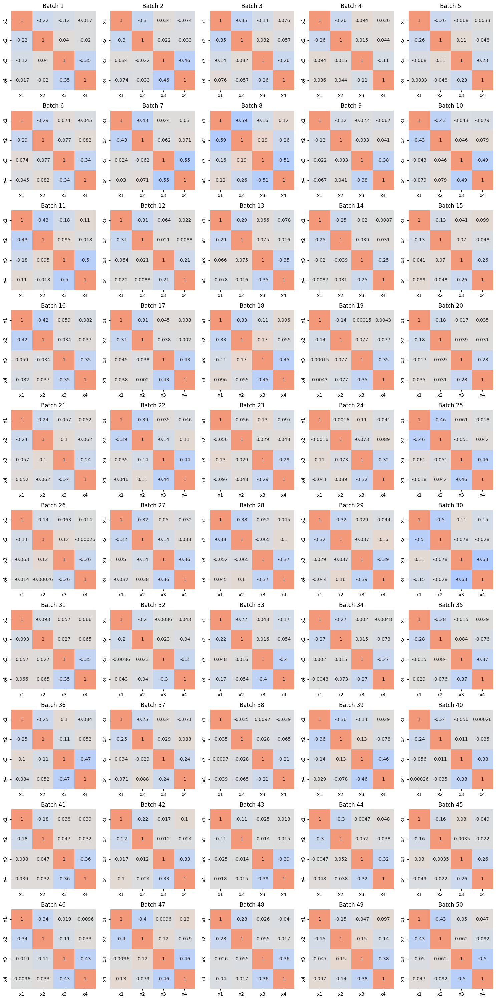

In [87]:
batch_list = machine_df.Batch.unique().tolist()
n_batches = len(batch_list)
n_cols = 5 
n_rows = (n_batches + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))
axes = axes.flatten() 

for idx, Batch in enumerate(batch_list):
    machine_data = machine_df[machine_df['Batch'] == Batch][['x1', 'x2', 'x3', 'x4']]

    sns.heatmap(data=machine_data.corr(), vmin=-1, vmax=2, center=0,
        cmap='coolwarm', cbar=False, annot=True, ax=axes[idx])
    axes[idx].set_title(f'Batch {Batch}')

plt.tight_layout()
plt.show()

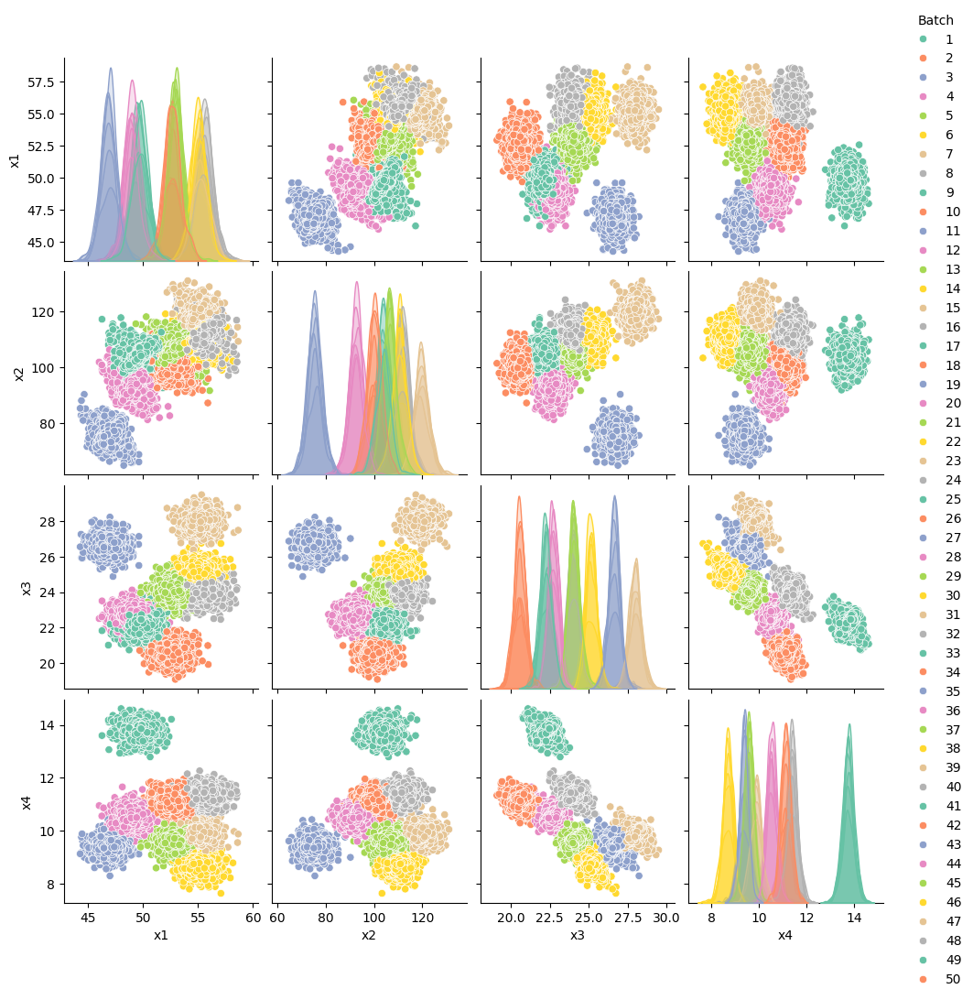

In [88]:
sns.pairplot(data=machine_df_rel, hue='Batch', palette='Set2')
plt.show()

we can conlude that:
* summary statistics and relationships between the OPERATING VARIABLESx1 through x4 does not vary too much across the three MACHINES
* summary statistics and relationships between the OPERATING VARIABLESx1 through x4 does vary across the 50 batches

## Problem 02

The supplier batch data set file name is provided for you below. You must read in the CSV file and assign the data set to the `batch_df` object. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in the data? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:
* Do the summary statistics for `Density` depend on the `Supplier`?
* Does the average `Density` depend on the `Supplier`?
* How does `Density` relate to `Batch` for each `Supplier`?

After exploring the `batch_df` DataFrame, you **MUST** JOIN/MERGE the `batch_df` DataFrame with the `machine_df` DataFrame. Assign the merged DataFrame to the `dfa` DataFrame.

You can now explore the relationships between the MACHINE OPERATIONAL VARIABLES and the SUPPLIERS! You must use visualizations to explore the following relationships:
* Explore if the summary statistics of the 4 OPERATING VARIABLES `x1` through `x4` vary across `Batch` for each MACHINE given each `Supplier`. Your figures MUST use `Batch` as the x-axis variable.
* Explore if the relationships between the 4 OPERATING VARIABLES `x1` through `x4` vary across `Supplier`.

You may add as many markdown and code cells as you see fit to answer this question.

#### SOLUTION

In [89]:
# define the batch supplier file
batch_file = 'midterm_supplier.csv'

In [90]:
# read in the batch supplier data set
batch_df = pd.read_csv('midterm_supplier.csv')
batch_df.head(5)

,Batch,Supplier,Density
0,1,B,10.388587
1,2,A,9.296880
2,3,A,9.565636
3,4,B,10.005387
4,5,A,9.339177


In [91]:
batch_df.shape

(50, 3)

* batch_df has 50 rows and 3 columns.

In [92]:
batch_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Batch     50 non-null     int64  
 1   Supplier  50 non-null     object 
 2   Density   50 non-null     float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.3+ KB


* the columns name are: Batch, Supplier, Density
* the datatypes are: int64, object, float64 respectively

In [93]:
batch_df.describe()

,Batch,Density
count,50.00000,50.000000
mean,25.50000,9.817937
std,14.57738,0.752225
min,1.00000,8.703627
25%,13.25000,9.294250
50%,25.50000,9.679999
75%,37.75000,10.156984
max,50.00000,12.246089


In [94]:
batch_df['Batch'] = batch_df['Batch'].astype('object')
batch_df.select_dtypes('object').describe()

,Batch,Supplier
count,50,50
unique,50,2
top,1,A
freq,1,30


In [95]:
batch_df.nunique()

Batch       50
Supplier     2
Density     50
dtype: int64

* Batch and Density have 50 unique values.
* Supplier has 2 unique values.

In [96]:
batch_df.isnull().sum()

Batch       0
Supplier    0
Density     0
dtype: int64

* there is no missing values for batch_df

#### batch_df Marginal Behavior

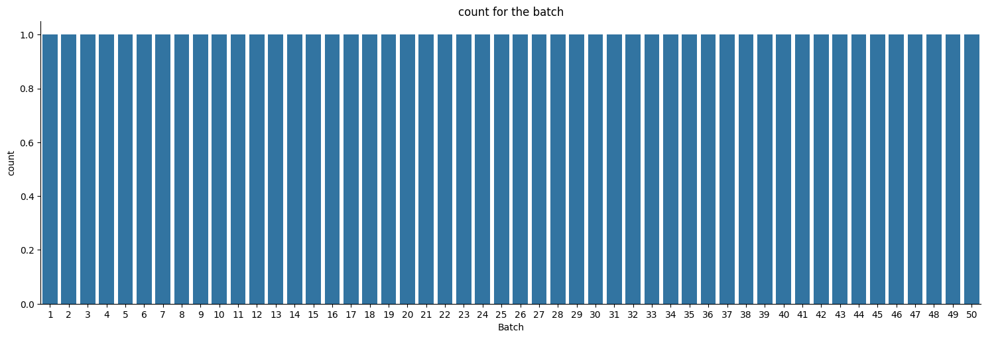

In [97]:
sns.catplot( data = batch_df, x='Batch', kind='count', aspect=3 )
plt.title('count for the batch')
plt.show()

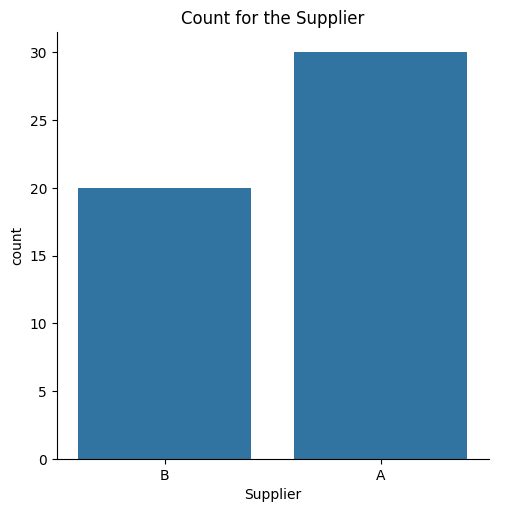

In [98]:
sns.catplot( data = batch_df, x='Supplier', kind='count' )
plt.title('Count for the Supplier')
plt.show()

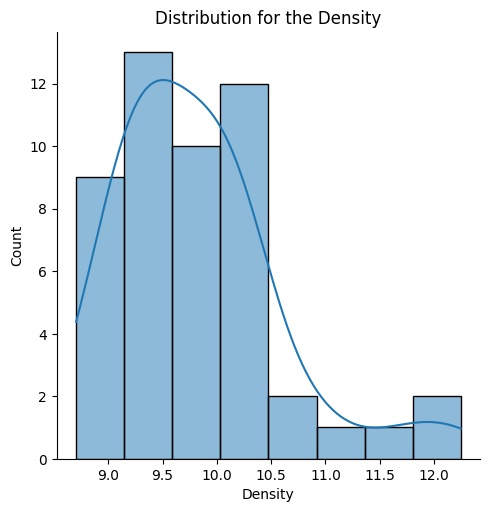

In [99]:
sns.displot(data = batch_df, x='Density', kind='hist', kde=True)
plt.title('Distribution for the Density')
plt.show()

#### batch_df Relationship analysis

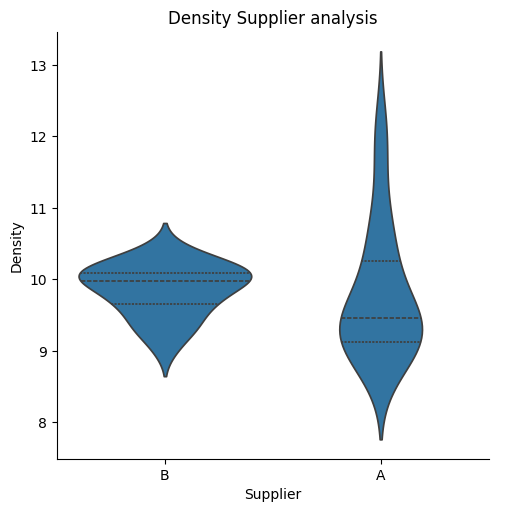

In [100]:
sns.catplot(data = batch_df, x='Supplier', y='Density', kind='violin',inner='quartile')
plt.title('Density Supplier analysis')
plt.show()

* yes we can see from the Density Supplier analysis plot that summary statistics for Density depend on the Supplier
* yes the average Density also depend on the Supplier?

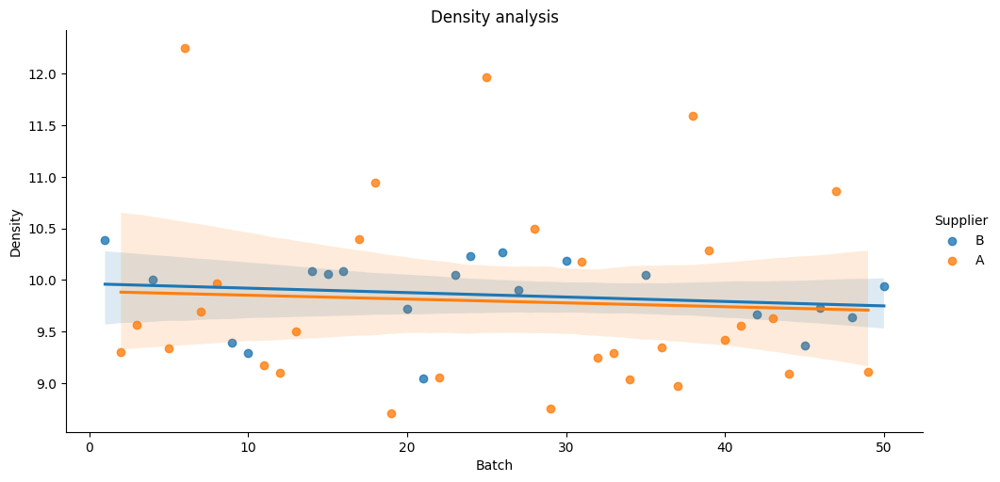

In [101]:
batch_df['Batch'] = batch_df.Batch.astype('int64')
sns.lmplot(data = batch_df, x='Batch', y='Density', hue='Supplier', aspect=2)
plt.title('Density analysis')
plt.show()

* looks like there is not too much relationship bewteen Batch and density for each Supplier

In [102]:
# merge the batch supplier data set with the (concatenated) machine data set
dfa = pd.merge( batch_df, machine_df, on='Batch' )
dfa.head(5)

,Batch,Supplier,Density,ID,s_id,x1,x2,x3,x4,machine_id
0,1,B,10.388587,B001-M01-S001,1,50.117118,102.167346,22.067812,13.889524,1
1,1,B,10.388587,B001-M01-S002,2,46.887333,112.266102,23.197330,13.064709,1
2,1,B,10.388587,B001-M01-S003,3,50.132744,103.674908,22.319933,13.647482,1
3,1,B,10.388587,B001-M01-S004,4,48.501042,107.143156,22.162947,14.077758,1
4,1,B,10.388587,B001-M01-S005,5,49.690442,102.120283,22.248696,13.728666,1


In [103]:
dfa.shape

(14729, 10)

* batch_df has 14729 rows and 10 columns.

In [104]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14729 entries, 0 to 14728
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Batch       14729 non-null  object 
 1   Supplier    14729 non-null  object 
 2   Density     14729 non-null  float64
 3   ID          14729 non-null  object 
 4   s_id        14729 non-null  object 
 5   x1          14729 non-null  float64
 6   x2          14729 non-null  float64
 7   x3          14729 non-null  float64
 8   x4          14729 non-null  float64
 9   machine_id  14729 non-null  object 
dtypes: float64(5), object(5)
memory usage: 1.1+ MB


* the columns name are: Batch, Supplier, Density, ID, s_id, x1, x2, x3, x4, machine_id
* the datatypes are: object, object, float64, object, object, float64, float64, float64，float64, object respectively

In [105]:
dfa.describe()

,Density,x1,x2,x3,x4
count,14729.000000,14729.000000,14729.000000,14729.000000,14729.000000
mean,9.735339,51.952606,101.966113,23.953500,10.612497
std,0.729389,3.093916,12.678550,2.203383,1.539387
min,8.703627,44.275379,64.774007,19.095832,7.644190
25%,9.289811,49.257492,96.189442,22.394977,9.481281
50%,9.624945,52.586639,104.533114,23.883004,10.344656
75%,10.083865,54.757788,110.415780,25.343060,11.300265
max,12.246089,58.647186,131.009046,29.477213,14.612911


In [106]:
dfa.select_dtypes('object').describe()

,Batch,Supplier,ID,s_id,machine_id
count,14729,14729,14729,14729,14729
unique,50,2,14729,149,3
top,12,A,B001-M01-S001,1,1
freq,380,9140,1,141,5152


In [107]:
list=['x1','x2','x3','x4']
dfa_lf = dfa.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid', 'machine_id', 'Batch','Density', 'Supplier'], value_vars=list)

In [108]:
dfa_lf.head(5)

,rowid,machine_id,Batch,Density,Supplier,variable,value
0,0,1,1,10.388587,B,x1,50.117118
1,1,1,1,10.388587,B,x1,46.887333
2,2,1,1,10.388587,B,x1,50.132744
3,3,1,1,10.388587,B,x1,48.501042
4,4,1,1,10.388587,B,x1,49.690442


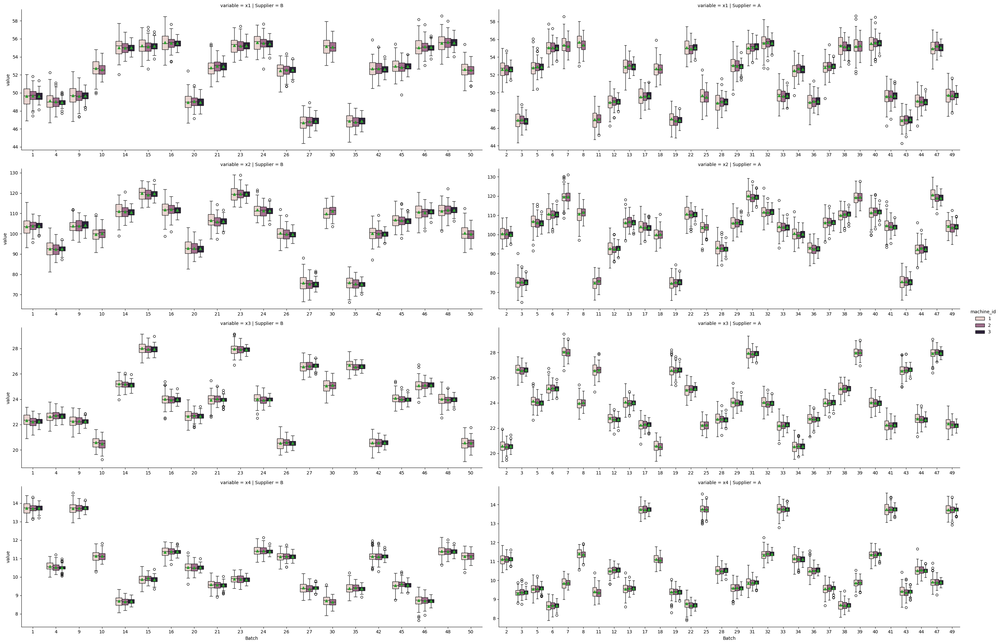

In [109]:
sns.catplot(data=dfa_lf, x='Batch',y='value', hue='machine_id', col='Supplier', row='variable', aspect=3, kind='box', showmeans=True, sharex=False,sharey=False)
plt.show()

* we can see that the the summary statistics of the 4 OPERATING VARIABLES x1 through x4 vary across Batch for each MACHINE given each Supplier

In [110]:
dfa_rel = dfa.drop(columns=['ID','s_id','machine_id','Batch','Density'])
dfa_rel.head(5)

,Supplier,x1,x2,x3,x4
0,B,50.117118,102.167346,22.067812,13.889524
1,B,46.887333,112.266102,23.197330,13.064709
2,B,50.132744,103.674908,22.319933,13.647482
3,B,48.501042,107.143156,22.162947,14.077758
4,B,49.690442,102.120283,22.248696,13.728666


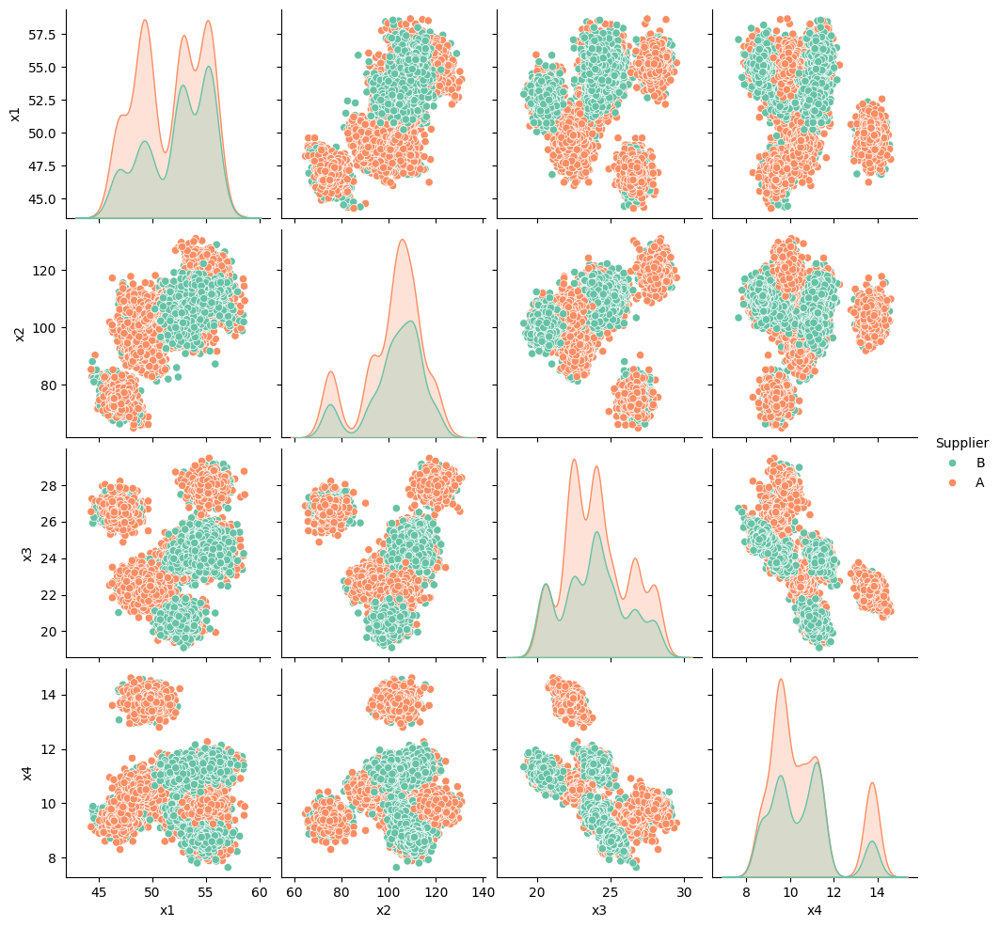

In [111]:
sns.pairplot(data=dfa_rel,hue='Supplier',palette='Set2')
plt.show()

* yes we can see that the relationships between the 4 OPERATING VARIABLES x1 through x4 vary across Supplier.

## Problem 03

The DROP TEST result data set file name is provided for you below. You must read in the CSV file and assign the dta set to the `test_df` object. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in the data? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:
* Count the number of times each unique value of `Result` occurs for each `test_group_id` value.

After exploring the `test_df` DataFrame, you **MUST** JOIN/MERGE the `test_df` DataFrame with the `dfa` DataFrame. Assign the merged DataFrame to the `dfb` DataFrame. You **MUST** answer the following:
* How many rows remain using the DEFAULT joining procedure?

You may add as many markdown and code cells as you see fit to answer this question. 

#### SOLUTION

In [112]:
# define the test data set file name
test_file = 'midterm_test.csv'

In [113]:
# read in the test data set
test_df = pd.read_csv(test_file)
test_df.shape

(1412, 3)

* batch_df has 1412 rows and 3 columns.

In [114]:
test_df.head(5)

,ID,test_group_id,Result
0,B001-M01-S056,A-0,1
1,B001-M01-S002,A-0,1
2,B001-M01-S049,A-0,1
3,B001-M01-S030,A-0,0
4,B001-M01-S048,A-0,1


In [115]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ID             1412 non-null   object
 1   test_group_id  1412 non-null   object
 2   Result         1412 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 33.2+ KB


* the columns name are: ID, test_group_id, Result
* the datatypes are: object, object, int64, respectively

In [116]:
test_df.nunique()

ID               1412
test_group_id     141
Result              2
dtype: int64

* ID has 1412 unique values.
* test_group_id has 141 unique values.
* Result has 2 unique values.

In [117]:
test_df.isnull().sum()

ID               0
test_group_id    0
Result           0
dtype: int64

* there is no missing value for test_df

### test_df Marginal Behavior

In [118]:
test_df.describe()

,Result
count,1412.000000
mean,0.301700
std,0.459158
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [119]:
test_df.select_dtypes('object').describe()

,ID,test_group_id
count,1412,1412
unique,1412,141
top,B001-M01-S056,L-4
freq,1,14


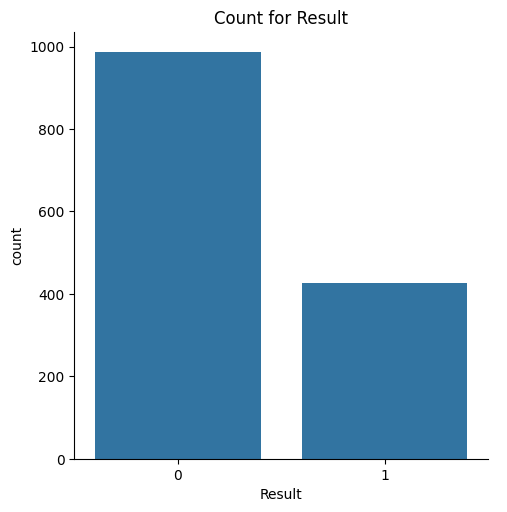

In [120]:
sns.catplot(data = test_df, x='Result', kind='count' )
plt.title('Count for Result')
plt.show()

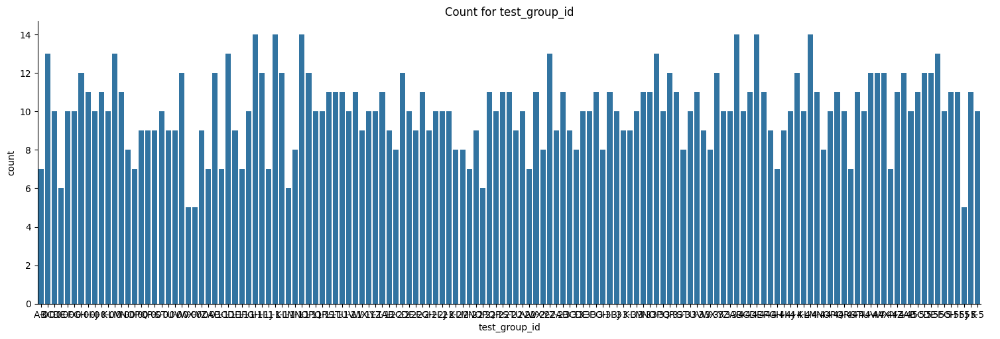

In [121]:
sns.catplot( data = test_df, x='test_group_id', kind='count', aspect=3)
plt.title('Count for test_group_id')
plt.show()

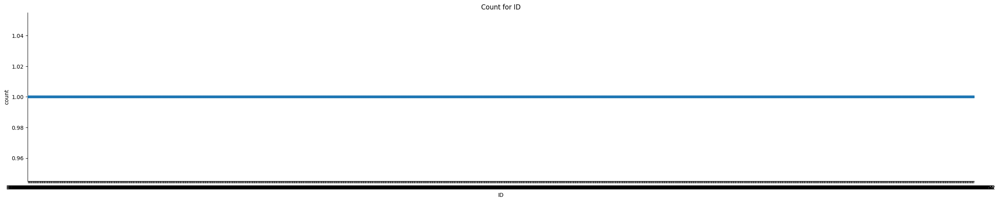

In [122]:
id_counts = test_df.groupby('ID').size().reset_index(name='count')
sns.catplot( data = id_counts, x='ID', y='count', aspect=5)
plt.title('Count for ID')
plt.show()

### test_df Relationships

In [123]:
group = test_df.groupby(['Result', 'test_group_id']).size().reset_index(name='count')
group.head(5)

,Result,test_group_id,count
0,0,A-0,1
1,0,A-1,8
2,0,A-2,5
3,0,A-3,9
4,0,A-4,11


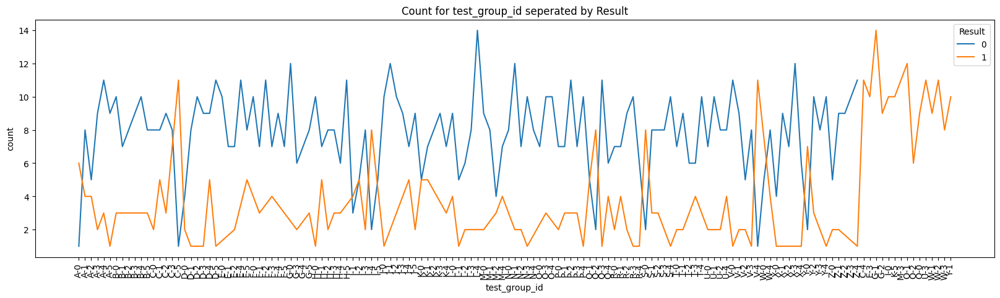

In [124]:
plt.figure(figsize=(20, 5))
sns.lineplot(data = group, x='test_group_id', y='count', hue='Result')
plt.title('Count for test_group_id seperated by Result')
plt.xticks(rotation=90) 
plt.show()

* the above graph plot the counts for test_group_id seperated by results

In [125]:
# merge test_df with the dfa object
dfb = pd.merge(test_df, dfa, on='ID')
dfb.head(5)

,ID,test_group_id,Result,Batch,Supplier,Density,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S056,A-0,1,1,B,10.388587,56,49.215485,105.647327,21.410531,14.154576,1
1,B001-M01-S002,A-0,1,1,B,10.388587,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S049,A-0,1,1,B,10.388587,49,49.125629,112.323042,22.874947,13.743788,1
3,B001-M01-S030,A-0,0,1,B,10.388587,30,48.306819,109.445722,22.910858,13.839830,1
4,B001-M01-S048,A-0,1,1,B,10.388587,48,50.564504,109.184587,22.083064,13.954942,1


In [126]:
dfb.shape

(1412, 12)

* we can see that there are only 1412 rows for the new dataframe. its because default is inner join 

## Problem 04

You must now examine the merged `dfb` object and answer the following:

* Count the number of times each unique value of `Result` occurs for each value of `machine_id`.
* Count the number of times each unique value of `Result` occurs for each value of `Supplier`.
* Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id`.
* Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id` and `Supplier`.
* Calculate the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id`.
* Visualize the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id` and for each unique value of `Supplier`.

*HINT*: Remember that a FAILED test is encoded as `Result == 1`. How can you calculate the PROPORTION of times `Result == 1`?

Add as many cells as you see fit to answer this question.

#### SOLUTION

In [127]:
dfb.head(5)

,ID,test_group_id,Result,Batch,Supplier,Density,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S056,A-0,1,1,B,10.388587,56,49.215485,105.647327,21.410531,14.154576,1
1,B001-M01-S002,A-0,1,1,B,10.388587,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S049,A-0,1,1,B,10.388587,49,49.125629,112.323042,22.874947,13.743788,1
3,B001-M01-S030,A-0,0,1,B,10.388587,30,48.306819,109.445722,22.910858,13.839830,1
4,B001-M01-S048,A-0,1,1,B,10.388587,48,50.564504,109.184587,22.083064,13.954942,1


In [128]:
dfb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             1412 non-null   object 
 1   test_group_id  1412 non-null   object 
 2   Result         1412 non-null   int64  
 3   Batch          1412 non-null   object 
 4   Supplier       1412 non-null   object 
 5   Density        1412 non-null   float64
 6   s_id           1412 non-null   object 
 7   x1             1412 non-null   float64
 8   x2             1412 non-null   float64
 9   x3             1412 non-null   float64
 10  x4             1412 non-null   float64
 11  machine_id     1412 non-null   object 
dtypes: float64(5), int64(1), object(6)
memory usage: 132.5+ KB


In [129]:
dfb.nunique()

ID               1412
test_group_id     141
Result              2
Batch              50
Supplier            2
Density            50
s_id              134
x1               1412
x2               1412
x3               1412
x4               1412
machine_id          3
dtype: int64

In [130]:
dfb.isnull().sum()

ID               0
test_group_id    0
Result           0
Batch            0
Supplier         0
Density          0
s_id             0
x1               0
x2               0
x3               0
x4               0
machine_id       0
dtype: int64

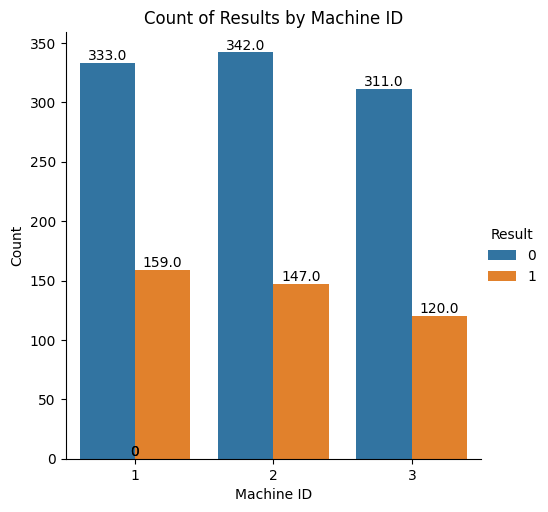

In [131]:
g = sns.catplot(data=dfb, x='machine_id', hue='Result', kind='count')

for ax in g.axes.flat:
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom')

plt.title('Count of Results by Machine ID')
plt.xlabel('Machine ID')
plt.ylabel('Count')
plt.show()

* There are 333 0 Result and 159 1 Result for Machine 1.
* There are 342 0 Result and 147 1 Result for Machine 2.
* There are 311 0 Result and 120 1 Result for Machine 3.

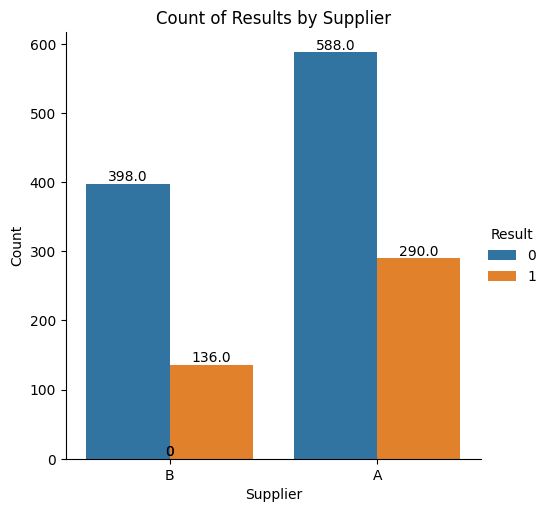

In [132]:
s = sns.catplot(data=dfb, x='Supplier', hue='Result', kind='count')

for ax in s.axes.flat:
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom')

plt.title('Count of Results by Supplier')
plt.xlabel('Supplier')
plt.ylabel('Count')
plt.show()

* There are 398 0 Result and 136 1 Result for Supplier B
* There are 588 0 Result and 290 1 Result for Supplier A

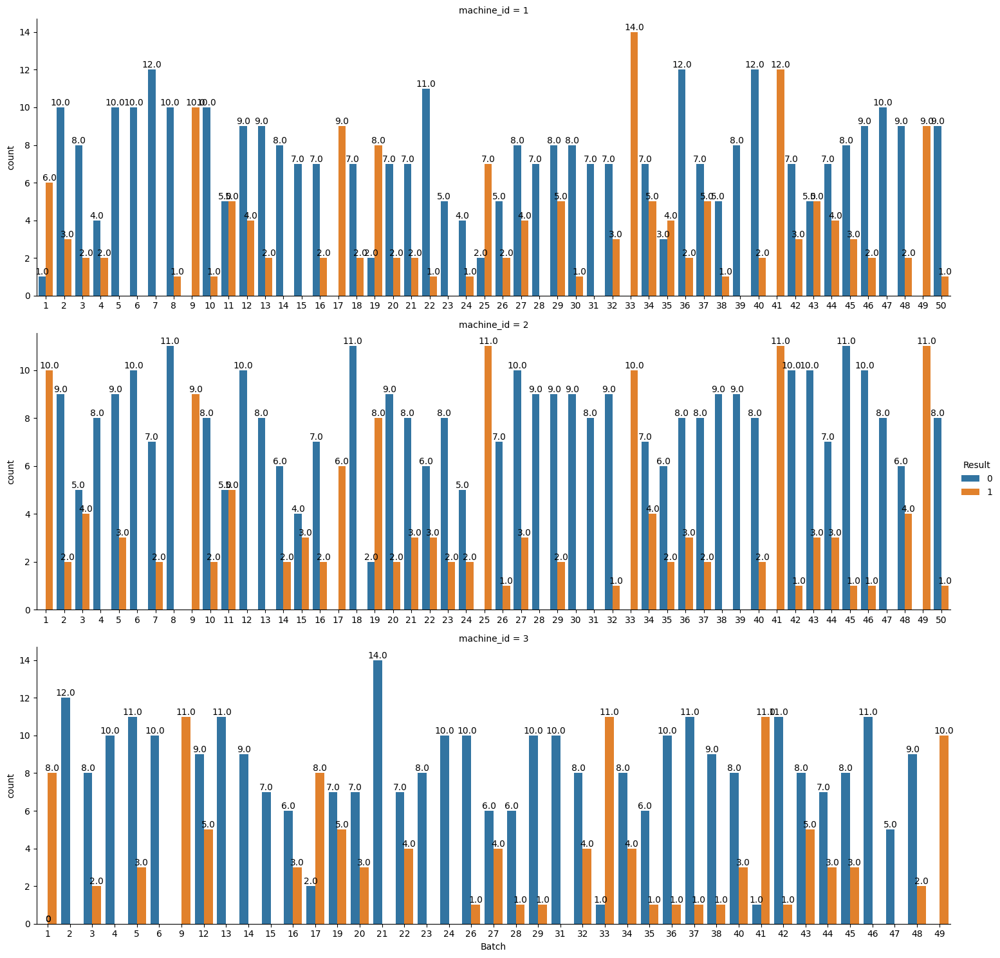

In [133]:
b = sns.catplot(data=dfb, x='Batch', hue='Result', row='machine_id',kind='count', sharex=False, sharey=False, aspect=3)
for ax in b.axes.flat:
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom')
plt.show()

* the above plot is the count of Result occurs per Batch for each value of machine_id.

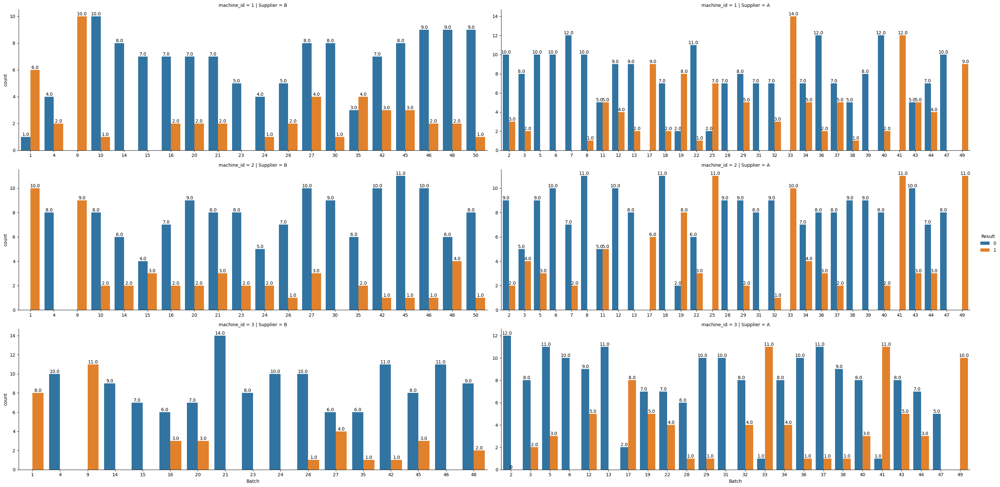

In [134]:
b = sns.catplot(data=dfb, x='Batch', hue='Result', row='machine_id', col='Supplier', kind='count', sharex=False, sharey=False,aspect=3)
for ax in b.axes.flat:
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom')
plt.show()

* the above plot is the count of Result occurs per Batch for each value of machine_id and Supplier

#### FAILED test calculation：(PROPORTION of times Result == 1)

In [135]:
dfb.head(5)

,ID,test_group_id,Result,Batch,Supplier,Density,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S056,A-0,1,1,B,10.388587,56,49.215485,105.647327,21.410531,14.154576,1
1,B001-M01-S002,A-0,1,1,B,10.388587,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S049,A-0,1,1,B,10.388587,49,49.125629,112.323042,22.874947,13.743788,1
3,B001-M01-S030,A-0,0,1,B,10.388587,30,48.306819,109.445722,22.910858,13.839830,1
4,B001-M01-S048,A-0,1,1,B,10.388587,48,50.564504,109.184587,22.083064,13.954942,1


In [136]:
result = dfb.groupby(['Batch','machine_id'])['Result'].mean()
result = result.reset_index().rename(columns={'Result':'fail_rate'})

result.head(5)

,Batch,machine_id,fail_rate
0,1,1,0.857143
1,1,2,1.000000
2,1,3,1.000000
3,2,1,0.230769
4,2,2,0.181818


* The above is the proportion of failed test for each Batch per machine_id.

In [137]:
result_supplier = dfb.groupby(['Batch','machine_id','Supplier'])['Result'].mean()
result_supplier = result_supplier.reset_index().rename(columns={'Result':'fail_rate'})
result_supplier.head(5)

,Batch,machine_id,Supplier,fail_rate
0,1,1,B,0.857143
1,1,2,B,1.000000
2,1,3,B,1.000000
3,2,1,A,0.230769
4,2,2,A,0.181818


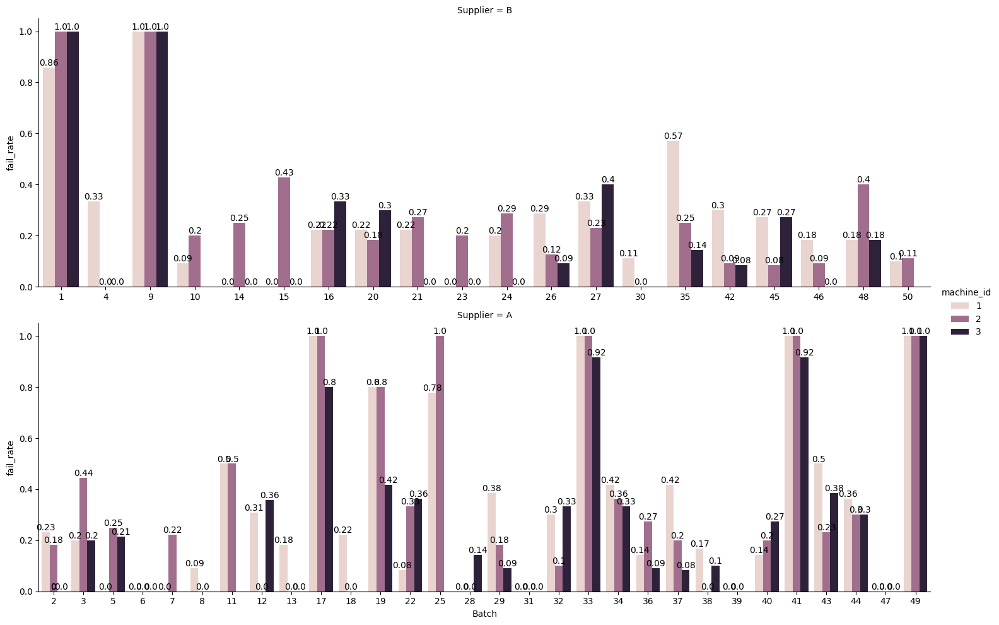

In [138]:
s = sns.catplot(data=result_supplier, x='Batch', y='fail_rate', hue='machine_id', row='Supplier', kind='bar', sharey=False, sharex=False, aspect=3)

for ax in s.axes.flat:
    for p in ax.patches:
        rounded_height = round(p.get_height(), 2)
        ax.annotate(f'{rounded_height}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='bottom')
plt.show()

* the above graph is the proportion of failed test in each Batch per machine_id and for each unique value of Supplier.

## Problem 05

You must cluster the rows of `dfb` using the 4 operational variables `x1` through `x4`. You must decide how many clusters to use and describe how you made that choice. You may use KMeans OR Hierarchical clustering. Include any figures that helped you make that choice.

Visualize your cluster analysis results by:
* Plotting the number of observations per cluster.
* Visualizing the relationships between the operational variables GIVEN the cluster.

You are interested in the PROPORTION of cell phone cases that failed the DROP TEST. Are any of the clusters associated with higher failure PROPORTIONS than others? Based on your visualizations how would you describe that cluster?

Add as many cells as you see fit to answer this question.

#### SOLUTION

In [139]:
features=['x1', 'x2', 'x3', 'x4']
target=['Result']
dfb_cluster_features= dfb[features]
dfb_cluster_target= dfb[target]
dfb_cluster_features.head(3)

,x1,x2,x3,x4
0,49.215485,105.647327,21.410531,14.154576
1,46.887333,112.266102,23.197330,13.064709
2,49.125629,112.323042,22.874947,13.743788


In [140]:
dfb_cluster_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x1      1412 non-null   float64
 1   x2      1412 non-null   float64
 2   x3      1412 non-null   float64
 3   x4      1412 non-null   float64
dtypes: float64(4)
memory usage: 44.3 KB


In [141]:
dfb_cluster_target.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   Result  1412 non-null   int64
dtypes: int64(1)
memory usage: 11.2 KB


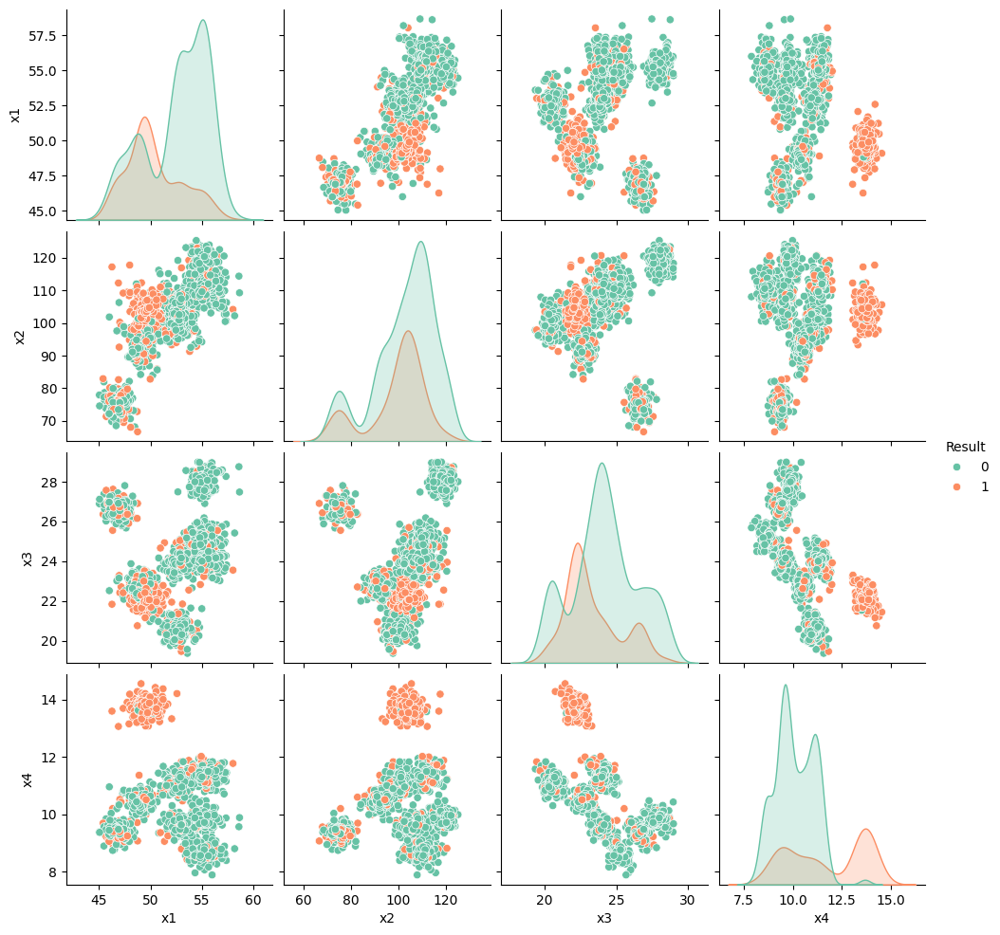

In [142]:
sns.pairplot(dfb, vars=['x1', 'x2', 'x3', 'x4'], hue='Result', palette='Set2')
plt.show()

In [143]:
scaler = StandardScaler()
features_scaled = scaler.fit_transform(dfb_cluster_features)

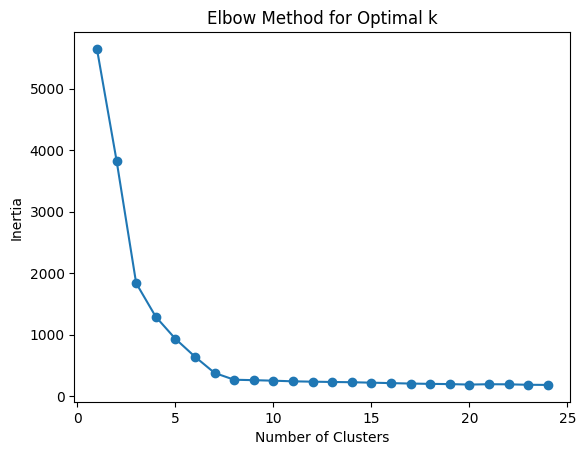

In [144]:
inertia = []
for k in range(1, 25):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 25), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

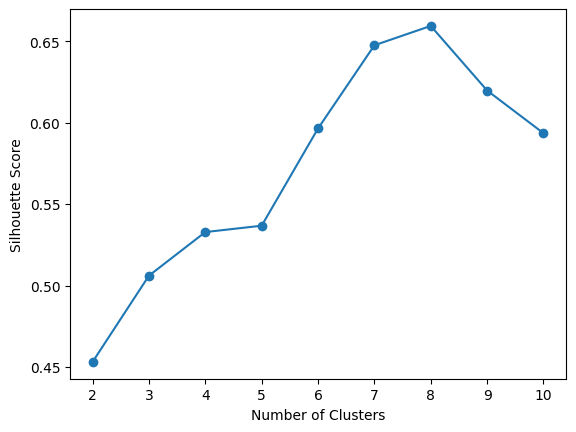

In [145]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(features_scaled)
    score = silhouette_score(features_scaled, labels)
    silhouette_scores.append(score)

plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

* from the score we can see that we should select 4 as the n_clusters 

In [146]:
kmeans = KMeans(n_clusters=4, random_state=42)
dfb['cluster'] = kmeans.fit_predict(features_scaled)

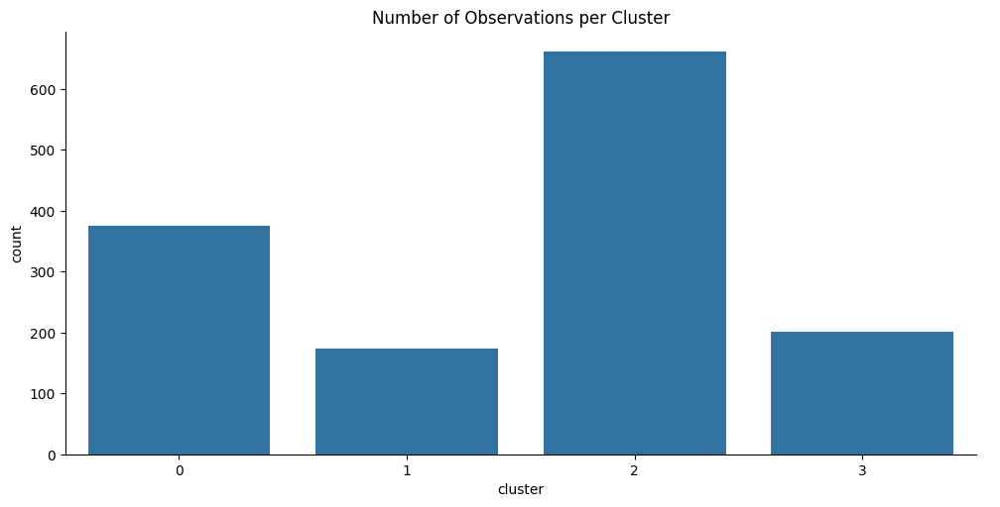

In [147]:
sns.catplot(data=dfb, x='cluster', kind='count', aspect=2)
plt.title('Number of Observations per Cluster')
plt.show()

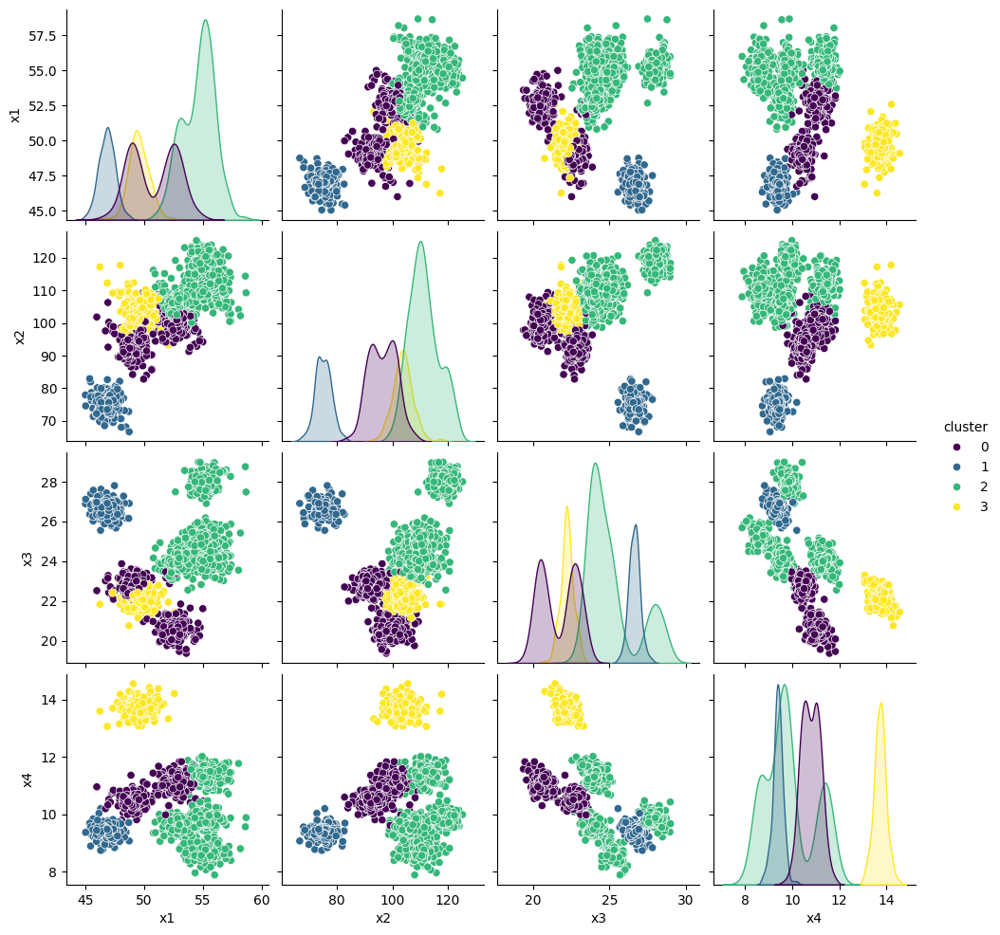

In [148]:
sns.pairplot(dfb, vars=['x1', 'x2', 'x3', 'x4'], hue='cluster', palette='viridis')
plt.show()

In [149]:
dfb.head(5)

,ID,test_group_id,Result,Batch,Supplier,Density,s_id,x1,x2,x3,x4,machine_id,cluster
0,B001-M01-S056,A-0,1,1,B,10.388587,56,49.215485,105.647327,21.410531,14.154576,1,3
1,B001-M01-S002,A-0,1,1,B,10.388587,2,46.887333,112.266102,23.197330,13.064709,1,3
2,B001-M01-S049,A-0,1,1,B,10.388587,49,49.125629,112.323042,22.874947,13.743788,1,3
3,B001-M01-S030,A-0,0,1,B,10.388587,30,48.306819,109.445722,22.910858,13.839830,1,3
4,B001-M01-S048,A-0,1,1,B,10.388587,48,50.564504,109.184587,22.083064,13.954942,1,3


In [150]:
dfb_lf = dfb.reset_index().rename(columns={'index': 'rowid'}).melt(id_vars=['rowid','Result','cluster'], value_vars=dfb_cluster_features)
dfb_lf.head(5)

,rowid,Result,cluster,variable,value
0,0,1,3,x1,49.215485
1,1,1,3,x1,46.887333
2,2,1,3,x1,49.125629
3,3,0,3,x1,48.306819
4,4,1,3,x1,50.564504


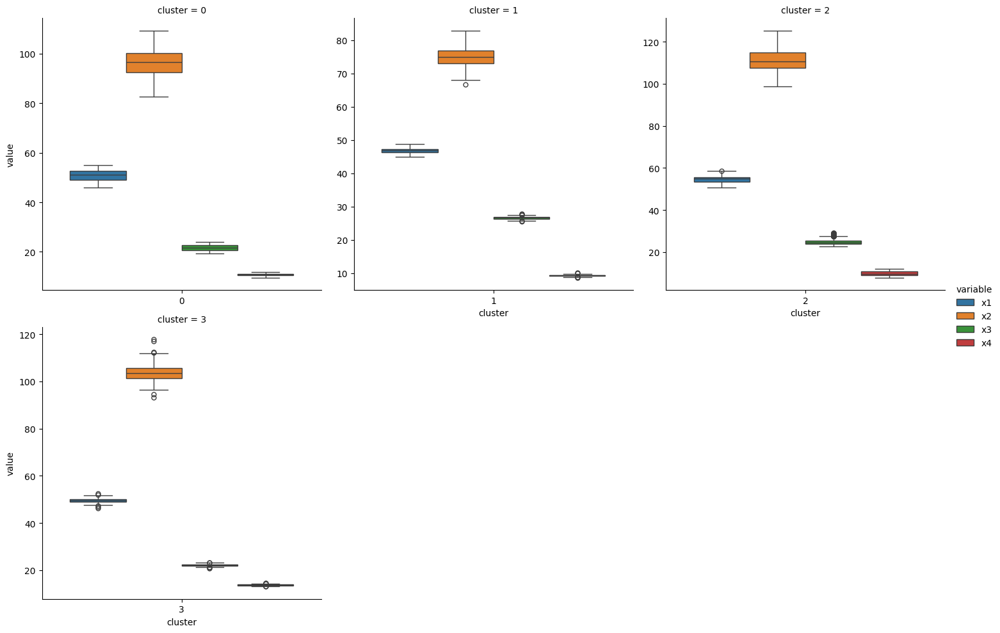

In [151]:
sns.catplot(data=dfb_lf, x='cluster', y='value', kind='box', col='cluster', hue='variable',col_wrap=3, sharex=False, sharey=False)
plt.show()

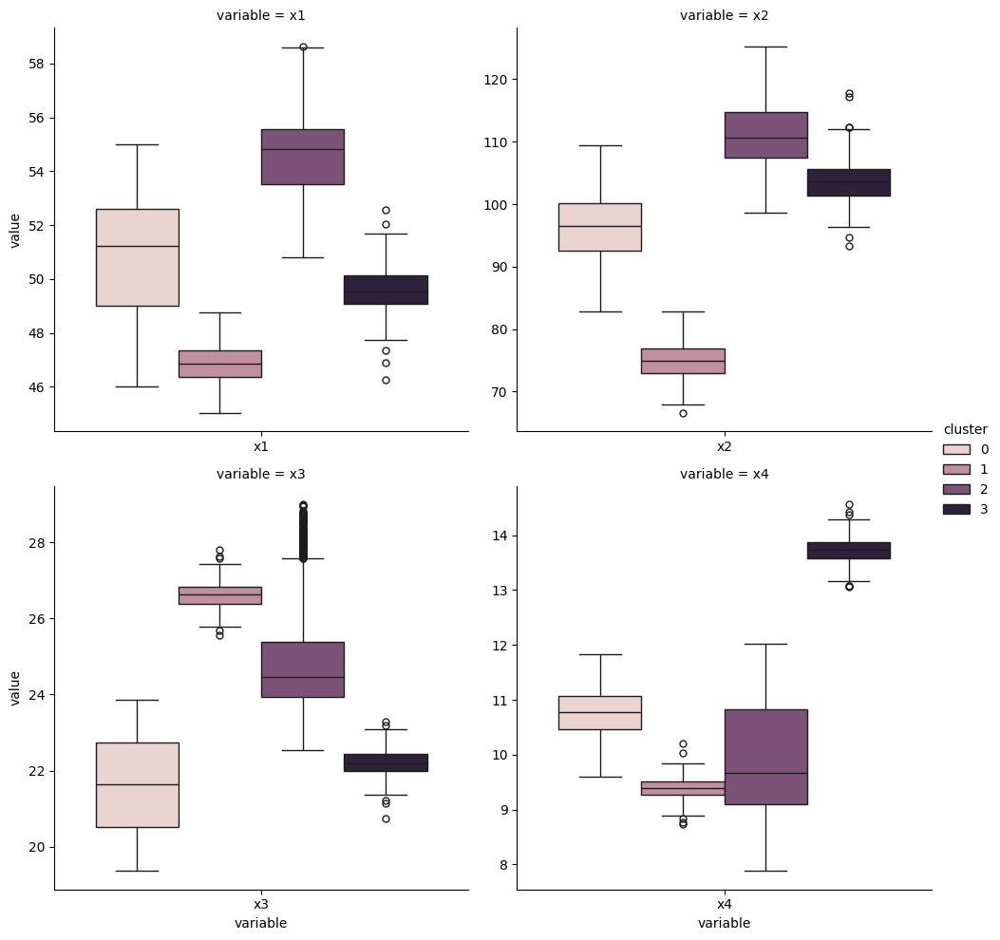

In [152]:
sns.catplot(data=dfb_lf, x='variable', y='value', kind='box', col='variable', hue='cluster',col_wrap=2, sharex=False, sharey=False)
plt.show()

In [153]:
dfb.groupby('cluster')['Result'].mean()

cluster
0    0.183511
1    0.402299
2    0.140696
3    0.965174
Name: Result, dtype: float64

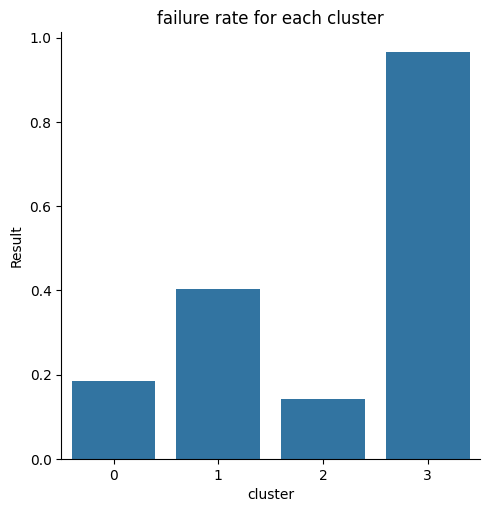

In [154]:
sns.catplot(data=dfb.groupby('cluster')['Result'].mean(), kind='bar')
plt.title('failure rate for each cluster')
plt.show()

* from the above graphs we can see that, cluster 3 has the highest failure rate. it is 96.5%
* class 2 has the lowest failure rate, which is only 14%